### Importing Libraries

In [135]:
# importing the libraries
from bs4 import BeautifulSoup
import requests
import pandas as pd
import numpy as np
import nltk

### Downloading Required Dependencies from the NLTK Library

In [136]:
# NLTK DOWNLOADS
# 1. Stopwords
nltk.download('stopwords')
# 2. Wordnet
nltk.download('wordnet')
# 3. Wordnet lemma
nltk.download('wordnet_ic')
# 4. Punkt
nltk.download('punkt')
# 5. Tagger to check if word is a noun or not
nltk.download('averaged_perceptron_tagger')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package wordnet_ic to /root/nltk_data...
[nltk_data]   Package wordnet_ic is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

### Helper Function for the BFS Algorithm used for building graph

In [137]:
# function to get children links from a given link
import time

# initializing the counter
cnter = 0

def get_children(link):
    
    # using the global counter
    global cnter

    # incrementing the counter
    cnter += 1

    # printing the counter value to check the progress of the function
    print(f'{cnter}. Getting children links from: ' + link)
    
    # Sleep for a bit to avoid getting blocked
    time.sleep(1)
    
    # requesting the link
    page = requests.get(link)

    # parsing the html
    soup = BeautifulSoup(page.content, 'html.parser')
    
    # getting the links
    links = soup.find_all('a')

    # initializing the list to store the links
    math_links = []
    
    # looping through the links
    for link in links:

        # getting the link
        l = link.get('href')

        # Filtering the links
        if l is not None and l.startswith('/wiki/') and ":" not in l and "Main_Page" not in l:
            # appending the link to the list
            true_link = 'https://en.wikipedia.org' + l
            math_links.append(true_link)
    
    # Remove duplicates
    return list(set(math_links))

### BFS Code for Graph Building

In [138]:
# BFS algorithm to build the graph

# Number of Nodes in my graph
NUM_NODES = 500


def bfs(links):
    
    # Dictionary to store all children links for each node
    all_children = {}
    
    # Initialize the queue
    queue = []
    # All the root nodes
    queue.extend(links)
    # Visited will also store the parent link
    visited = {}

    # Currently there are len(links) node in the queue
    size = len(links)

    # initializing the visited nodes
    for link in links:
        visited[link] = list()

    # looping through the queue
    while queue:

        # getting the first element in the queue
        current = queue.pop(0)

        # getting the children links 
        children = get_children(current)
        
        # appending the children to the visited dictionary
        all_children[current] = children.copy()
        
        # For now limiting children per node so that more and more nodes get explored for children links and only a few nodes do not exhaust our graph
        if len(children) > 5:
            # Pick random 5 children
            children = np.random.choice(children, 5, replace=False)
            
        # looping through the children
        for child in children:

            # if the child is not visited
            if child not in visited:

                # add the child to the queue
                visited[child] = [current]
                queue.append(child)

                # increment the size
                size += 1

                # if the size is greater than the number of nodes then break
                if size >= NUM_NODES:
                    break
            else:
                visited[child].append(current)

        # if the size is greater than the number of nodes then break
        if size >= NUM_NODES:
            break
    
    print("Re-Exploring the graph to find more edges...")
    # Re-Explore the graph to get all the edges among existing nodes
    for link in visited:
        
        # Get the children
        if link in all_children: # If node was previously explored
            children = all_children[link]
        else:
            # Get the children from the new node
            children = get_children(link)

        # looping through the children  
        for child in children:
            # if the child is not visited then add it to the visited dictionary
            if child in visited and link not in visited[child] and child != link:
                visited[child].append(link)

    # return the visited dictionary
    return visited

### Importing the Root Nodes

In [139]:
# This code was used when working with the older labelling sheet which was not yet cleaned.
# # Import the file containing the root nodes
# FILE_PATH = './Wiki Math Articles - Sheet1.csv'
# df = pd.read_csv(FILE_PATH)
# df.head()
# # Extract Label and Link columns into a separate dataframe
# df = df[['Link', 'Label']]
# df.head()

FILE_PATH = './Output.csv'
df = pd.read_csv(FILE_PATH)
df = df[['Link', 'Label']]
df

,Link,Label
0,https://en.wikipedia.org/wiki/Absolute_value,1
1,https://en.wikipedia.org/wiki/Addition_theorem,1
2,https://en.wikipedia.org/wiki/Adjugate_matrix,2
3,https://en.wikipedia.org/wiki/Algebra_of_sets,2
4,https://en.wikipedia.org/wiki/Algorithm,2
...,...,...
459,https://en.wikipedia.org/wiki/Wald%E2%80%93Wol...,1
460,https://en.wikipedia.org/wiki/Weibull_distribu...,2
461,https://en.wikipedia.org/wiki/Weighted_arithme...,1
462,https://en.wikipedia.org/wiki/Wiener%E2%80%93K...,3



### Cleaning the Data

In [140]:
# This code was used when working with the older labelling sheet which was not yet cleaned.
# # Remove empty rows
# df = df.dropna()
# # Replace label for each link with most frequent label for that link
# for link in df['Link']:
#     # Get the most frequent label for the link
#     label = df[df['Link'] == link]['Label'].value_counts().idxmax()
#     # Replace the label in the dataframe
#     df.loc[df['Link'] == link, 'Label'] = label
# # Remove duplicate rows
# df = df.drop_duplicates()

In [141]:
df.head()

,Link,Label
0,https://en.wikipedia.org/wiki/Absolute_value,1
1,https://en.wikipedia.org/wiki/Addition_theorem,1
2,https://en.wikipedia.org/wiki/Adjugate_matrix,2
3,https://en.wikipedia.org/wiki/Algebra_of_sets,2
4,https://en.wikipedia.org/wiki/Algorithm,2


In [142]:
# Extract the root nodes
NUMBER_OF_ROOT_NODES = 50

# initializing the root nodes
root_nodes = []

# initializing the difficulty_map
difficulty_map = {}

# looping through the root nodes
for i in range(len(df)):

    # getting the link
    node = df['Link'].iloc[i]
    
    # getting the label
    difficulty = df['Label'].iloc[i]
    
    # appending the difficulty to the difficulty_map dictionary 
    difficulty_map[node] = difficulty
    
    # appending the node to the root_nodes list
    root_nodes.append(node)
    
    if i == NUMBER_OF_ROOT_NODES-1:
        break


In [143]:
print(len(root_nodes), len(difficulty_map))

50 50


In [144]:
print(root_nodes, difficulty_map)

['https://en.wikipedia.org/wiki/Absolute_value', 'https://en.wikipedia.org/wiki/Addition_theorem', 'https://en.wikipedia.org/wiki/Adjugate_matrix', 'https://en.wikipedia.org/wiki/Algebra_of_sets', 'https://en.wikipedia.org/wiki/Algorithm', 'https://en.wikipedia.org/wiki/Altitude_(triangle)', 'https://en.wikipedia.org/wiki/Angle_bisector_theorem', 'https://en.wikipedia.org/wiki/Antiderivative', 'https://en.wikipedia.org/wiki/Area_under_the_curve_(pharmacokinetics)', 'https://en.wikipedia.org/wiki/Arithmetic_mean', 'https://en.wikipedia.org/wiki/Arithmetic_progression', 'https://en.wikipedia.org/wiki/Arithmetico%E2%80%93geometric_sequence', 'https://en.wikipedia.org/wiki/Arithmetico–geometric_sequence', 'https://en.wikipedia.org/wiki/Asymptote', 'https://en.wikipedia.org/wiki/Basis_(linear_algebra)', 'https://en.wikipedia.org/wiki/Bayes%27_theorem', 'https://en.wikipedia.org/wiki/Bayesian_probability', 'https://en.wikipedia.org/wiki/Bennett%27s_inequality', 'https://en.wikipedia.org/wiki

### Calling the BFS Algo and building the Graph

In [145]:
# calling the bfs function to get the children links
parent_map = bfs(root_nodes)

1. Getting children links from: https://en.wikipedia.org/wiki/Absolute_value
2. Getting children links from: https://en.wikipedia.org/wiki/Addition_theorem
3. Getting children links from: https://en.wikipedia.org/wiki/Adjugate_matrix
4. Getting children links from: https://en.wikipedia.org/wiki/Algebra_of_sets
5. Getting children links from: https://en.wikipedia.org/wiki/Algorithm
6. Getting children links from: https://en.wikipedia.org/wiki/Altitude_(triangle)
7. Getting children links from: https://en.wikipedia.org/wiki/Angle_bisector_theorem
8. Getting children links from: https://en.wikipedia.org/wiki/Antiderivative
9. Getting children links from: https://en.wikipedia.org/wiki/Area_under_the_curve_(pharmacokinetics)
10. Getting children links from: https://en.wikipedia.org/wiki/Arithmetic_mean
11. Getting children links from: https://en.wikipedia.org/wiki/Arithmetic_progression
12. Getting children links from: https://en.wikipedia.org/wiki/Arithmetico%E2%80%93geometric_sequence
13.

### Creating the Adjacency List using the Output of the BFS Graph Building Algorithm

In [146]:
# Adjacency list creation
adjacency_list = {}

# looping through the parent_map
for child in parent_map.keys():

    # getting the parent
    parents = parent_map[child]

    # if the child is not in the adjacency list then initialize it
    if child not in adjacency_list:
        adjacency_list[child] = []

    # looping through the parents   
    for parent in parents:
        
        # if the parent is not None 
        if parent is not None:
            
            # if the parent is not in the adjacency list then initialize it
            if parent not in adjacency_list:
                adjacency_list[parent] = []
            
            # appending the child to the parent's adjacency list
            adjacency_list[parent].append(child)

# print(adjacency_list)

In [147]:
# print(parent_map.keys())
print(len(parent_map.keys()))

500


In [148]:
print(len(adjacency_list.keys()))

500


### Using NetworkX Library to Visualise the Graph

500 500


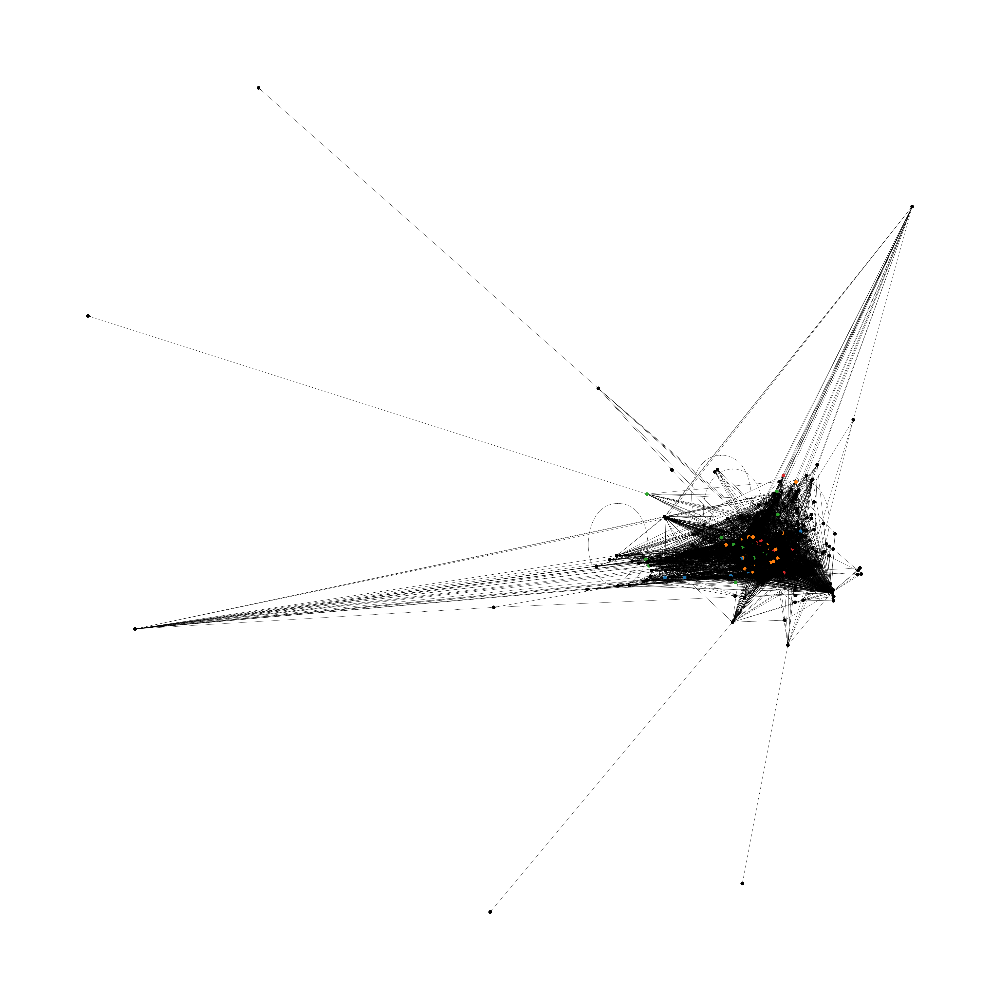

In [149]:
# Using networkx to create a graph

# Create a graph
import networkx as nx

# colors for the nodes
COLORS = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728']

# inititalize the node_colors
node_colors = []

G = nx.DiGraph()

# Creating the networkx graph using root nodes and adjacency list
for root in root_nodes:
    
    G.add_node(root)
    node_colors.append(COLORS[int(difficulty_map[root])])

for node in adjacency_list.keys():
    

    if node not in G.nodes():

        G.add_node(node)
        if node in difficulty_map:
            node_colors.append(COLORS[int(difficulty_map[node])])
        else:
            node_colors.append('#000000')
        
    
    for child in adjacency_list[node]:
        # If the child is not already in the graph, add it
        if child not in G.nodes():
            
            G.add_node(child)
            if child in difficulty_map:
                node_colors.append(COLORS[int(difficulty_map[child])])
            else:
                node_colors.append('#000000')
            
        G.add_edge(node, child)

# Draw the graph
import matplotlib.pyplot as plt
f = plt.figure()
# Set size of the figure
f.set_size_inches(70, 70)
print(G.number_of_nodes(), len(node_colors))
nx.draw(G, node_color=node_colors)

plt.show()
# nx.pagerank(G)

In [150]:
# Number of nodes in the graph
print(G.number_of_nodes())


500


In [151]:
print(G.number_of_edges())

9443


### Using Neo4j Graph Database to Store the Graph Created

In [152]:
# # Use neo4j to create a graph
# import neo4j

# # Create a graph database
# driver = neo4j.GraphDatabase.driver("bolt://localhost:7687", auth=("neo4j", "MYPASSWORD"))

# # Create a session
# session = driver.session()

# # Clear the graph
# session.run("MATCH (n) DETACH DELETE n")

# # Create the graph using adjacency list
# for node in adjacency_list.keys():
#     # Create a node
#     session.run("MERGE (n:Node {name: $name})", {"name": node})
#     # Create an edge between the node and its children
#     for child in adjacency_list[node]:
#         # If the child is not already in the graph then create a corresponding node
#         session.run("MERGE (n:Node {name: $name})", {"name": child})
#         session.run("MATCH (n1:Node {name: $name1}), (n2:Node {name: $name2}) CREATE (n1)-[:EDGE]->(n2)", {"name1": node, "name2": child})

In [153]:
# # Print the graph
# res = session.run("MATCH (n) RETURN n.name AS name")
# records = []
# for record in res:
#     records.append(record["name"])
# print(len(records))

### Function to get the content of a Wikipedia Page

In [154]:
def get_node_summary(node):
    # Sleep for a while to avoid getting blocked
    time.sleep(0.01)
    # Get the node summary
    # Node is a link to a wikipedia page
    r = requests.get(node)
    # Get the html content of the page
    html = r.text
    # Get the html content of the page
    soup = BeautifulSoup(html, 'html.parser')
    # Get the content of the page
    content = soup.find('div', {'id': 'mw-content-text'})
    # Get the text of the content
    text = content.get_text()
    return text

### Dictionary to store the node-contents

In [155]:
node_summary = {}

### Calculating the Set of all nodes

In [156]:
# Find all the nodes in the graph
records = set()
for node in parent_map.keys():
    records.add(node)

### Extracting the Content for all nodes

In [157]:
# Calculate the summary for each node
cnt = 0
for node in records:
    cnt += 1
    print(cnt, ":", node)
    # Get the node summary
    node_summary[node] = get_node_summary(node)

1 : https://en.wikipedia.org/wiki/Isotomic_conjugate
2 : https://en.wikipedia.org/wiki/Union_(set_theory)
3 : https://en.wikipedia.org/wiki/Constructible_universe
4 : https://en.wikipedia.org/wiki/Bayesian_analysis
5 : https://en.wikipedia.org/wiki/Graphics_processing_unit
6 : https://en.wikipedia.org/wiki/Minor_(linear_algebra)
7 : https://en.wikipedia.org/wiki/Real_multivariable_function
8 : https://en.wikipedia.org/wiki/Arithmetic_progression
9 : https://en.wikipedia.org/wiki/Zero_ring
10 : https://en.wikipedia.org/wiki/Addition_theorem
11 : https://en.wikipedia.org/wiki/Simple_linear_regression
12 : https://en.wikipedia.org/wiki/Wrapped_distribution
13 : https://en.wikipedia.org/wiki/Kripke%27s_theory_of_truth
14 : https://en.wikipedia.org/wiki/Map_(mathematics)
15 : https://en.wikipedia.org/wiki/Binary_operation
16 : https://en.wikipedia.org/wiki/Wrapped_Cauchy_distribution
17 : https://en.wikipedia.org/wiki/Euclid%27s_Elements
18 : https://en.wikipedia.org/wiki/Finitary_relation


In [158]:
print(len(node_summary))

500


### Importing Spacy Library for NLP

In [159]:
import spacy
# Give this command in the terminal
# ! python -m spacy download en_core_web_sm
nlp = spacy.load('en_core_web_sm')
stopwords = spacy.lang.en.stop_words.STOP_WORDS

### Function to extract the Keywords from the content of a Wikipedia Page using NLTK

In [160]:
# Extract keywords from the node summary using nltk
stopwords = nltk.corpus.stopwords.words('english')
stemmer = nltk.stem.PorterStemmer()

def extract_keywords2(text):
    tokens = nltk.word_tokenize(text)
    # Change to lowercase
    tokens = [w.lower() for w in tokens]
    # Remove stopwords
    tokens = [token for token in tokens if token not in stopwords]
    # Remove digits
    tokens = [token for token in tokens if not token.isdigit()]
    # Remove Space
    tokens = [token.strip() for token in tokens]
    # Take tokens with length greater than 2
    tokens = [token for token in tokens if len(token) > 2]
    # There should only be english characters in the token
    tokens = [token for token in tokens if token.isalpha()]

    # Take only nouns using nltk but it is a slow process
    real_tokens = []
    for token in tokens:
        # If the token is a noun
        # Tag the token 
        ans = nltk.pos_tag([token])
        val = ans[0][1]
        if val == 'NN' or val == 'NNS' or val == 'NNP' or val == 'NNPS':
            real_tokens.append(token)

    # Stem the tokens
    real_tokens = [stemmer.stem(token) for token in real_tokens]
    
    return real_tokens

### Function to calculate the Keywords from the Wiki Content using Spacy

In [161]:
# Extract keywords from the node summary
def extract_keywords(text):
    # Extract keywords from the node summary
    doc = nlp(text)
    # Extract keywords
    keywords = []
    for token in doc:
        if token.is_stop:
            continue
        if token.is_punct:
            continue
        if token.is_space:
            continue
        if token.is_digit:
            continue
        # Check if token is a stop word
        if token.lemma_ in stopwords:
            continue
        # Token should be a noun
        if token.pos_ != 'NOUN':
            continue
        # Token length should be greater than or equal to 3
        if len(token.text) < 3:
            continue
        if token.is_alpha:
            # Stem the token and add it to the list
            token = token.lemma_
            keywords.append(token.lower())
        
    # Remove duplicates
    # Not removing duplicates so that we can count the frequency of each keyword in the node summary
    # This will help us to calculate the tf-idf score
    # keywords = list(set(keywords))
    
    return keywords

### Extracting the Keywords for all Links (Nodes)

In [162]:
# NLP FEATURES OF NODES
nlp_features = {}
cnt = 0
for node in node_summary.keys():
    cnt += 1
    # Extract keywords from the node summary
    keywords = extract_keywords(node_summary[node])
    # Add the keywords to the dictionary
    nlp_features[node] = keywords
    print(cnt, ":", node, '->', len(keywords))

1 : https://en.wikipedia.org/wiki/Isotomic_conjugate -> 116
2 : https://en.wikipedia.org/wiki/Union_(set_theory) -> 488
3 : https://en.wikipedia.org/wiki/Constructible_universe -> 811
4 : https://en.wikipedia.org/wiki/Bayesian_analysis -> 1968
5 : https://en.wikipedia.org/wiki/Graphics_processing_unit -> 2019
6 : https://en.wikipedia.org/wiki/Minor_(linear_algebra) -> 638
7 : https://en.wikipedia.org/wiki/Real_multivariable_function -> 1422
8 : https://en.wikipedia.org/wiki/Arithmetic_progression -> 479
9 : https://en.wikipedia.org/wiki/Zero_ring -> 410
10 : https://en.wikipedia.org/wiki/Addition_theorem -> 165
11 : https://en.wikipedia.org/wiki/Simple_linear_regression -> 1204
12 : https://en.wikipedia.org/wiki/Wrapped_distribution -> 517
13 : https://en.wikipedia.org/wiki/Kripke%27s_theory_of_truth -> 539
14 : https://en.wikipedia.org/wiki/Map_(mathematics) -> 576
15 : https://en.wikipedia.org/wiki/Binary_operation -> 613
16 : https://en.wikipedia.org/wiki/Wrapped_Cauchy_distribution

In [163]:
# Save Adjacency List, Parent Map, Node Summary, NLP Features to binary files
import pickle

# Save the adjacency list
with open('adjacency_list.pkl', 'wb') as f:
    pickle.dump(adjacency_list, f)

# Save the parent map
with open('parent_map.pkl', 'wb') as f:
    pickle.dump(parent_map, f)

# Save the node summary
with open('node_summary.pkl', 'wb') as f:
    pickle.dump(node_summary, f)

# Save the nlp features
with open('nlp_features.pkl', 'wb') as f:
    pickle.dump(nlp_features, f)
    

# Save the difficulty map
with open('difficulty_map.pkl', 'wb') as f:
    pickle.dump(difficulty_map, f)

In [164]:
import pickle
# load the adjacency list
with open('adjacency_list.pkl', 'rb') as f:
    adjacency_list = pickle.load(f)

# load the parent map
with open('parent_map.pkl', 'rb') as f:
    parent_map = pickle.load(f)

# load the node summary
with open('node_summary.pkl', 'rb') as f:
    node_summary = pickle.load(f)

# load the nlp features
with open('nlp_features.pkl', 'rb') as f:
    nlp_features = pickle.load(f)



In [165]:
# Checking Maximum number of keywords extracted from any link
max_keywords = 0
k = 0
link_with_max_keywords = ''
for node in nlp_features.keys():
    if len(nlp_features[node]) > max_keywords:
        max_keywords = len(nlp_features[node])
        k = nlp_features[node]
        link_with_max_keywords = node
print(max_keywords)
print(link_with_max_keywords)
# print(k)

4877
https://en.wikipedia.org/wiki/Reliability_engineering


### Checking Keywords Extracted for a sample wiki page

In [166]:
sample_link = list(parent_map.keys())[1]
sample_keywords = nlp_features[sample_link]

In [167]:
print("Sample Link:", sample_link)
print(len(sample_keywords))
print(sample_keywords)

Sample Link: https://en.wikipedia.org/wiki/Addition_theorem
165
['function', 'term', 'parser', 'output', 'style', 'parser', 'output', 'parser', 'output', 'style', 'parser', 'output', 'article', 'addition', 'theorem', 'addition', 'theorem', 'function', 'angle', 'addition', 'formula', 'mathematic', 'addition', 'theorem', 'formula', 'function', 'function', 'term', 'case', 'function', 'sin', 'cos', 'function', 'case', 'cos', 'function', 'sin', 'word', 'function', 'unit', 'circle', 'scope', 'idea', 'addition', 'theorem', 'century', 'discovery', 'addition', 'theorem', 'function', 'addition', 'theorem', 'restriction', 'type', 'function', 'identity', 'vector', 'component', 'addition', 'theorem', 'vector', 'polynomial', 'set', 'variable', 'conclusion', 'mathematician', 'time', 'theory', 'function', 'possibility', 'equation', 'polynomial', 'function', 'function', 'type', 'solution', 'language', 'theory', 'group', 'group', 'variety', 'example', 'function', 'number', 'result', 'variety', 'conditio

### Building a vocabulary from all the Keywords

In [168]:
# Build a vocabulary of keywords
vocabulary = set()
for node in nlp_features.keys():
    for keyword in nlp_features[node]:
        vocabulary.add(keyword)
print("Size of the vocabulary:", len(vocabulary))

Size of the vocabulary: 13576


### Calculating the IDF for all the Keywords in our Vocabulary

In [169]:
# Calculating the IDF scores
# IDF SCORE OF A KEYWORD IS DOCUMENT INDEPENDENT
idf_scores = {}
# TF -> Term Frequency, i.e. the number of times a keyword appears in a document
# IDF -> Inverse Document Frequency, i.e. inverse of the number of documents in the corpus that contain a keyword

# Document Frequency of a keyword
freq_scores = {}
for keyword in vocabulary:
    # Initialize the frequency score
    freq_scores[keyword] = 0
    # Initialize the idf score
    idf_scores[keyword] = 0

# Calculate the frequency score
for keyword in vocabulary:
    for node in nlp_features.keys():
        # If the keyword is in the NLP Features of this node, then increase frequency by 1
        if keyword in nlp_features[node]:
            freq_scores[keyword] += 1


# Calculate the idf score
# Taking log to scale the values
for keyword in vocabulary:
    idf_scores[keyword] = np.log(len(nlp_features.keys()) / freq_scores[keyword] + 1)

### Function to Calculate the TF-IDF for a given set of keywords

In [170]:
# Function to calculate the tf-idf score of a node
def tf_idf_calc(node_keywords):
    global vocabulary
    global idf_scores
    ans = {}
    # Filter Keywords that are not in the vocabulary
    node_keywords = [keyword for keyword in node_keywords if keyword in vocabulary]
    
    # Calculate the tf-idf score
    max_freq = max(node_keywords.count(k) for k in node_keywords)
    for keyword in node_keywords:
        # For TF score, the Augmented Variation is used
        # In the augmented variation, 50% weight is given to the fact that term that is present in the node summary
        # and other 50% weight is decided by the frequency of the term in the node summary divided by the maximum frequency of any term in the node summary
        ans[keyword] = (0.5 + 0.5 * (node_keywords.count(keyword) / max_freq)) * idf_scores[keyword]
    return ans

In [171]:
# Calculate the tf-idf scores
tf_idf_scores = {}
for node in nlp_features.keys():
    tf_idf_scores[node] = tf_idf_calc(nlp_features[node])

In [172]:
# Checking the tf-idf score of a node
print("Sample Link:", sample_link)
print(tf_idf_scores[sample_link])

Sample Link: https://en.wikipedia.org/wiki/Addition_theorem
{'function': 0.7625770078183719, 'term': 0.4889674739567752, 'parser': 0.6931471805599453, 'output': 0.6931471805599453, 'style': 0.39045863412958204, 'article': 0.462137080729637, 'addition': 0.9309951830422223, 'theorem': 0.6874591047412325, 'angle': 0.806432406486595, 'formula': 0.6129896234198738, 'mathematic': 0.5371993980105776, 'case': 0.48522078059314927, 'sin': 1.0615319002530583, 'cos': 1.1225894725303605, 'word': 0.6658019845234467, 'unit': 0.7480754071325793, 'circle': 0.8807172485540994, 'scope': 1.5225749427102055, 'idea': 0.7915759134085485, 'century': 0.7974398948893673, 'discovery': 1.1556495007028047, 'restriction': 1.163329282034945, 'type': 0.39607031879149057, 'identity': 0.7075279870557025, 'vector': 0.6965109643488966, 'component': 0.8004107967416868, 'polynomial': 1.018502802725146, 'set': 0.5312227445870821, 'variable': 0.615873143628748, 'conclusion': 1.2702441309838652, 'mathematician': 0.83493149174

### FILL THE TF-IDF FEATURE VECTORS OF OUR NODES IN A DATAFRAME

In [173]:
# Convert the tf-idf scores to a dataframe
# Orient to index since, i want my keys(links) to be the index and keywords to be columns
TF_IDF_DATAFRAME = pd.DataFrame.from_dict(tf_idf_scores, orient='index')
# Fill NaN values with 0
TF_IDF_DATAFRAME = TF_IDF_DATAFRAME.fillna(0)
TF_IDF_DATAFRAME.head()
# Every row of this dataframe is a node and its corresponding tf-idf scores (feature vectors)

,geometry,conjugate,point,respect,triangle,way,base,line,side,midpoint,...,candidature,pmf,ham,supermarket,lean,fatness,fading,hydroclimatology,vtetheory,combinant
https://en.wikipedia.org/wiki/Isotomic_conjugate,0.691430,2.249708,0.776668,0.872915,0.982252,0.535473,0.958594,0.712369,1.081180,1.674487,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Graphics_processing_unit,0.670477,0.000000,0.510186,0.000000,0.952487,0.519246,0.000000,0.577866,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Zero_ring,0.689493,0.000000,0.000000,0.000000,0.000000,0.515974,0.945168,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Map_(mathematics),0.674565,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Euclid%27s_Elements,0.755009,0.000000,0.514035,0.000000,0.975801,0.514370,0.000000,0.604664,0.964471,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [174]:
# Save the dataframe to a csv file
TF_IDF_DATAFRAME.to_csv('TF_IDF_DATAFRAME_SPACY.csv')

In [175]:
# Load the dataframe from the csv file
# First column is the node and the rest are the tf-idf scores
# First column which is read will be the index of the dataset
TF_IDF_DATAFRAME = pd.read_csv('TF_IDF_DATAFRAME_SPACY.csv', index_col=0)
TF_IDF_DATAFRAME.head()

,geometry,conjugate,point,respect,triangle,way,base,line,side,midpoint,...,candidature,pmf,ham,supermarket,lean,fatness,fading,hydroclimatology,vtetheory,combinant
https://en.wikipedia.org/wiki/Isotomic_conjugate,0.691430,2.249708,0.776668,0.872915,0.982252,0.535473,0.958594,0.712369,1.081180,1.674487,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Graphics_processing_unit,0.670477,0.000000,0.510186,0.000000,0.952487,0.519246,0.000000,0.577866,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Zero_ring,0.689493,0.000000,0.000000,0.000000,0.000000,0.515974,0.945168,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Map_(mathematics),0.674565,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Euclid%27s_Elements,0.755009,0.000000,0.514035,0.000000,0.975801,0.514370,0.000000,0.604664,0.964471,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [176]:
TF_IDF_DATAFRAME.tail()

,geometry,conjugate,point,respect,triangle,way,base,line,side,midpoint,...,candidature,pmf,ham,supermarket,lean,fatness,fading,hydroclimatology,vtetheory,combinant
https://en.wikipedia.org/wiki/Radian_per_second,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Journal_of_the_American_Statistical_Association,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Midhinge,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Kunita%E2%80%93Watanabe_inequality,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Pleiotropy_(drugs),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


500 500


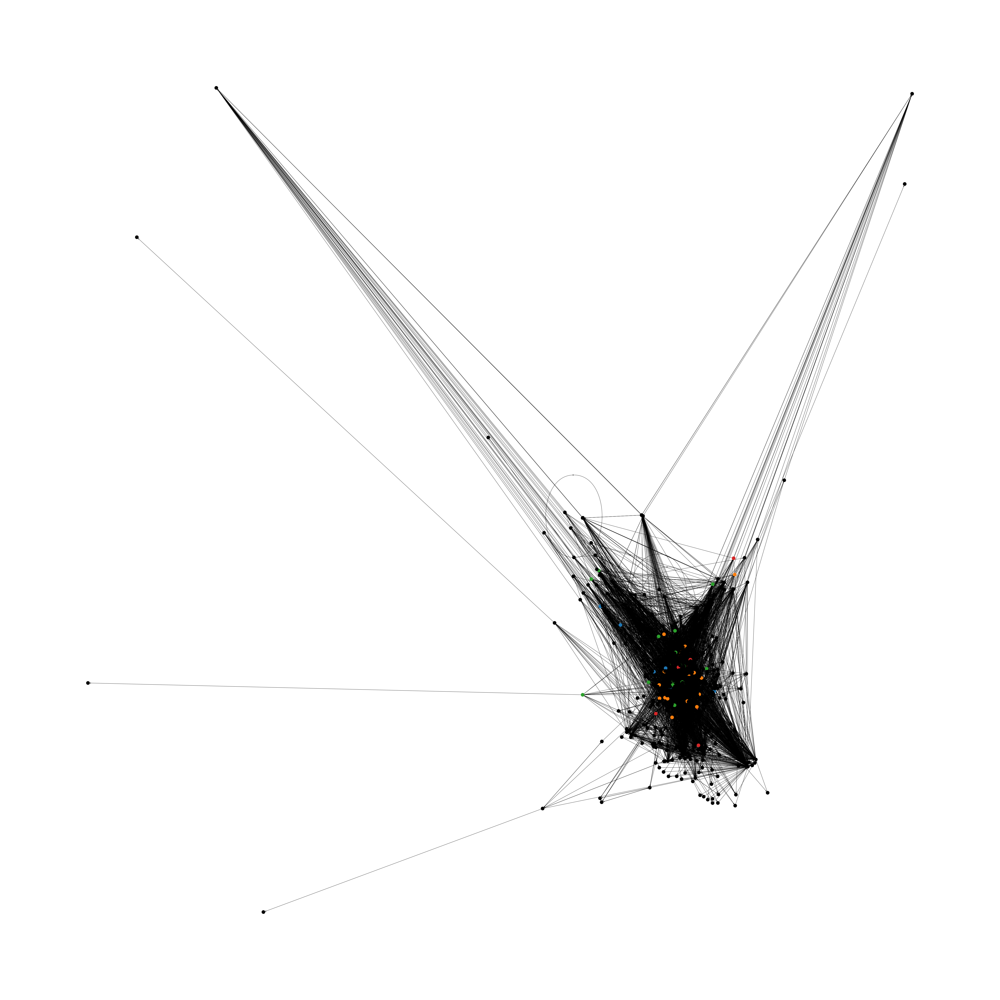

In [177]:
# Using networkx to create a graph
# Create a graph
import networkx as nx

COLORS = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728']

node_colors = []

G = nx.DiGraph()

for root in root_nodes:
    
    G.add_node(root)
    node_colors.append(COLORS[int(difficulty_map[root])])


# For each node in the graph, add its children
for node in adjacency_list.keys():
    
    if node not in G.nodes():

        G.add_node(node)
        if node in difficulty_map:
            node_colors.append(COLORS[int(difficulty_map[node])])
        else:
            node_colors.append('#000000')
        
    
    for child in adjacency_list[node]:
        # If the child is not already in the graph, add it
        if child not in G.nodes():
            
            G.add_node(child)
            if child in difficulty_map:
                node_colors.append(COLORS[int(difficulty_map[child])])
            else:
                node_colors.append('#000000')
            
        G.add_edge(node, child)

# Draw the graph
import matplotlib.pyplot as plt
f = plt.figure()
# Set size of the figure
f.set_size_inches(70, 70)
print(G.number_of_nodes(), len(node_colors))
nx.draw(G, node_color=node_colors)

plt.show()
# nx.pagerank(G)



### CENTRALITY METRICS

In [178]:
import numpy as np

all_pairs_shortest_paths = dict()

# Finding Centrality scores for each node
# We will find the following centrality scores:

# 1. Degree Centrality : Manual Implementation is also done.
degree_centralities = nx.degree_centrality(G)
# 2. Clustering Coefficient : Manual Implementation is also done.
clustering_coefficients = nx.clustering(G)
# 3. Closeness Centrality : Manual Implementation is also done.
closeness_centralities = nx.closeness_centrality(G)
# 4. Betweenness Centrality
betweenness_centralities = nx.betweenness_centrality(G)
# 5. PageRank 
page_ranks = nx.pagerank(G)

# Degree Centrality in a directed graph
# Degree centrality is the sum of InDegree and OutDegree of node divided by the number of nodes - 1
# Degree centrality is a measure of the importance of a node in the network
def degree_centrality(node, adjacency_list):

    # Get the children of the node
    neighbors = adjacency_list[node].copy()
    # Get parent nodes of the node
    neighbors.extend(parent_map[node])
    
    # if adjaceny list is empty, return 0
    if(len(adjacency_list) == 0):
        return 0
    
    # degree centrality is the sum of InDegree and OutDegree of node divided by the number of nodes - 1
    degree_centrality_score = len(neighbors) / (len(adjacency_list) - 1)
    return degree_centrality_score

# Local Clustering Coefficient in a directed graph
# Clustering Coefficient of a node is the number of edges between the neighbors of a node divided by the number of possible edges
# Clustering Coefficient is a measure of the importance of a node in the network
def local_clustering_coefficient(node, adjacency_list):

    # Using NetworkX Library
    # global clusterering_coefficients
    # return clustering_coefficients[node]
    
    # Get the neighbors of the node
    neighbors = adjacency_list[node].copy()
    # Get parent nodes of the node
    neighbors.extend(parent_map[node])

    # Calculate the local clustering coefficient
    local_clustering_coefficient = 0
    for neighbor in neighbors:
        # Get the neighbors of the neighbor
        neighbors_of_neighbor = adjacency_list[neighbor].copy()
        # Calculate the number of edges between the neighbors of the node
        num_edges = 0
        for neighbor_of_neighbor in neighbors_of_neighbor:
            if neighbor_of_neighbor in neighbors:
                num_edges += 1
        # Calculate the local clustering coefficient
        local_clustering_coefficient += num_edges
        
    # Divide by the number of possible edges to get the local clustering coefficient
    if len(neighbors) > 1:
        # total pairs in neighbourhood = n*(n-1)/2. Since we are calculating directed edges, so there are two edges possible , i.e. (A,B) and (B,A). 
        # Therefore, total edges = 2*n*(n-1)/2 = n*(n-1)
        local_clustering_coefficient = local_clustering_coefficient / (len(neighbors) * (len(neighbors) - 1))
        return local_clustering_coefficient
    else:
        return 0


# The shortest path from a source node to all other nodes in the graph
def SSSP(source, adjacency_list):
    
    # We have an unweighted graph so simple queue will work
    # BFS will simply be sufficient to find the shortest paths
    
    # Initialize the distance dictionary
    distance = {}
    # Initialize distances with infinity
    for node in adjacency_list.keys():
        distance[node] = np.inf
    # Initialize the visited dictionary
    visited = {}
    # Initialize the queue
    queue = []
    # Mark the source node as visited
    visited[source] = True
    # Initialize the distance of the source node to 0
    distance[source] = 0
    # Add the source node to the queue
    queue.append(source)
    # While the queue is not empty
    while queue:
        # Pop the first element from the queue
        n = queue.pop(0)
        # Get the neighbors of the node
        neighbors = adjacency_list[n].copy()
        # For each neighbor
        for neighbor in neighbors:
            # If the neighbor is not visited
            if neighbor not in visited:
                # Mark the neighbor as visited
                visited[neighbor] = True
                # Update the distance of the neighbor
                distance[neighbor] = distance[n] + 1
                # Add the neighbor to the queue
                queue.append(neighbor)
    # Return the distance dictionary
    return distance        

# All pairs shortest path algorithm using SSSP for all nodes
def all_pairs_shortest_path(adjacency_list):
    ans = {}
    # Initialize the distance matrix
    for node in adjacency_list.keys():
        sssp_node = SSSP(node, adjacency_list)
        ans[node] = sssp_node
    return ans

# Closeness Centrality in a directed graph
# Closeness centrality is the sum of the shortest path lengths from a node to all other nodes
# In the manual implementation, C(u) = N-1 / Sum(d(v) for v in V)
# Since, we have a directed graph, we will consider the d(v) = d(u,v) i.e. time taken to reach v from u.
# Closeness centrality tells us how fast we can reach the other nodes. Hence, the above distance assumption.
# d(u, v) is the shortest path length from u to v
# N is the number of nodes in the graph
def closeness_centrality(node, adjacency_list):
    
    # We can simply do this to get the centrality using the NetworkX library
    # global closeness_centralities
    # closeness_centrality = closeness_centralities[node]
    # return closeness_centrality
    
    # We need all pairs shortest path lengths already calculated for better performance
    global all_pairs_shortest_paths
    
    # If the all pairs shortest path lengths are not calculated
    if len(all_pairs_shortest_paths) == 0:
        all_pairs_shortest_paths = all_pairs_shortest_path(adjacency_list)
    
    # Calculate the summation d(v) for our node in its connected component
    sum_of_shortest_paths = 0
    nodes_in_cc = 1
    
    for v in all_pairs_shortest_paths.keys():
        if node == v:
            continue
        d_u_v = all_pairs_shortest_paths[node][v]
        # If distance from the node to the v is not infinity
        if d_u_v != np.inf :
            sum_of_shortest_paths += (d_u_v)
            nodes_in_cc += 1
            
    # If there is only one node in the cc, then the closeness centrality is 0
    if nodes_in_cc == 1:
        return 0
    
    # Calculate the closeness centrality
    closeness_centrality = (nodes_in_cc - 1) / sum_of_shortest_paths
    return closeness_centrality


def betweenness_centrality(node, adjacency_list):
    global betweenness_centralities
    betweenness_centrality = betweenness_centralities[node]
    return betweenness_centrality


def page_rank(node, adjacency_list):
    global page_ranks
    page_rank = page_ranks[node]
    return page_rank


### IMPLEMENTING THE NLP EMBEDDINGS OF WORDS

Function to Calculate the Co-Occurence Matrix

In [179]:
# This mapping maps the indexes of the co-occurance matrix to our real words
mapping_word_index = {}

# Calculate the co-occurence matrix
def get_co_occurrence_matrix(nodes_list, window_size=1):

    global nlp_features
    global vocabulary
    global mapping_word_index

    # Initialize the co-occurence matrix
    co_occurrence_matrix = np.zeros((len(vocabulary), len(vocabulary)))
    
    mapping_word_index = {}
    cnt = 0
    
    # looping over vocabulary
    for word in vocabulary:

        # if word is not in the mapping_word_index then add it
        if word not in mapping_word_index:
            mapping_word_index[word] = cnt
            cnt += 1

    for node in nodes_list:
        # Node Keywords
        node_keywords = nlp_features[node]
        # Window Size = 1 => Window will consider 1 word before and 1 word after the node
        for i in range(len(node_keywords)):
            # window in the left side of the node word 
            window_l = max(0, i - window_size)

            # window in the right side of the node word
            window_r = min(len(node_keywords) - 1, i + window_size)

            word_index = mapping_word_index[node_keywords[i]]
            for j in range(window_l, window_r + 1):
                
                neighbor_word_index = mapping_word_index[node_keywords[j]]
                # if the word is not the same as the node word
                if j != i:
                    co_occurrence_matrix[word_index][neighbor_word_index] += 1
    
    return co_occurrence_matrix

In [180]:
mat = get_co_occurrence_matrix(adjacency_list.keys())
print(mat)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 4.]]


In [181]:
# Verifying the shape of our co-occurrence matrix
print(len(vocabulary), "=>", np.array(mat).shape)

13576 => (13576, 13576)


SVD Decomposition

In [182]:
import scipy
# SVD Decomposition of the co-occurrence matrix
U, s, V = scipy.linalg.svd(mat)
print(U.shape, s.shape, V.shape)

(13576, 13576) (13576,) (13576, 13576)


In [183]:
# Save the SVD decomposition of the co-occurrence matrix
np.save("U.npy", U)
np.save("s.npy", s)
np.save("V.npy", V)

In [184]:
# Load the SVD decomposition of the co-occurrence matrix
U = np.load("U.npy")
s = np.load("s.npy")
V = np.load("V.npy")

In [185]:
print(U.shape, s.shape, V.shape)

(13576, 13576) (13576,) (13576, 13576)


Selecting the Ideal K : We will select k-rankk embeddings for our words

In [186]:
# Find 'i' such that sum of s_0, s_1, s_2 .... s_i is more than 99% of Total Sum
# i.e. We want to maintain atleast 99% Approximation Quality as taught in the class.

prefix_sum_array = np.zeros(len(s))
sum = 0

# Calculating the Total Sum and the Prefix Sums Array
sum = 0
cnt = 0
for i in s:
  sum += i
  prefix_sum_array[cnt] = sum
  cnt += 1

# setting the threshold value as 99% of the Total Sum
threshold_value = (sum*99)/100

print("Threshold Sum:", threshold_value)

# Find the index of the lower_bound of threshold_sum in the Prefix Sums Array
# We will use binary_search to find the lower bound of threshold_sum

l = 0
r = len(prefix_sum_array)-1
k = -1

# Binary Search
while l <= r:
  
  mid = l + (r-l)//2

  # if the value at mid is less than the threshold_sum then the left pointer will be mid + 1
  if prefix_sum_array[mid] < threshold_value:
    l = mid+1

  # if the value at mid is greater than the threshold_sum 
  elif prefix_sum_array[mid] > threshold_value:

    # if mid is not 0 then we will check if the value at mid-1 is less than the threshold_sum
    if mid != 0 and prefix_sum_array[mid-1] > threshold_value:
      r = mid-1
    else:
      # Found the lower bound
      k = mid
      break
  # found the lower bound
  else:
    k = mid
    break

if k == -1:
  k = l

print("Ideal K Value is:", k)
print("Decreased the size of NLP Embeddings from", len(s), "to", k)

Threshold Sum: 221711.7970236539
Ideal K Value is: 6222
Decreased the size of NLP Embeddings from 13576 to 6222


Picking the k-Rank embeddings for Keywords

In [187]:
# Representation of the vocabulary as a vector
word_embeddings = {}
for word in vocabulary:
    word_embeddings[word] = U[mapping_word_index[word], :k]

In [188]:
print(word_embeddings['equation'])

[-1.26519597e-04  6.39069312e-05  9.63270679e-05 ... -5.82347086e-04
 -4.04448297e-04  8.93385419e-04]


In [189]:
# Save the word embeddings
with open("word_embeddings.pkl", "wb") as f:
    pickle.dump(word_embeddings, f)

In [190]:
word_embeddings = pickle.load(open("word_embeddings.pkl", "rb"))
# print(word_embeddings['equation'])

### Calculating TF-IDF Weighted NLP Embeddings for all nodes

In [191]:
weighted_average_embeddings = {}
nodes_list = list(adjacency_list.keys())
size_of_embeddings = k

# Calculating the weighted average embeddings
for node in nodes_list:
    
    # TF_IDF Series for the node from the TF_IDF DataFrame
    tf_idf_series = TF_IDF_DATAFRAME.loc[node]
    
    # Get tf-idf dictionary for the node
    node_tf_idf = tf_idf_series.to_dict()

    sum_of_tf_idf = 0
    
    # Node Embedding
    embedding = np.zeros(size_of_embeddings)

    # looping over the node_tf_idf dictionary
    for word in node_tf_idf:
        embedding += word_embeddings[word] * node_tf_idf[word]
        sum_of_tf_idf += node_tf_idf[word]
    
    embedding = embedding / sum_of_tf_idf
    
    weighted_average_embeddings[node] = embedding

In [192]:
# Checking weighted average embedding for a node
sample_link = list(adjacency_list.keys())[0]
print("Sample Link:", sample_link)
print(weighted_average_embeddings[sample_link])

Sample Link: https://en.wikipedia.org/wiki/Absolute_value
[-5.10746563e-03 -2.32695134e-05  3.69876678e-04 ...  3.81500984e-05
  8.58725980e-05  7.85095910e-04]


### TF-IDF Weighted Average NLP Embeddings using Word2Vec

In [193]:
from gensim.models import Word2Vec as w2v
# Get word embeddigs using Word2Vec

# Prepping Sentences
sentences = []
for node in adjacency_list.keys():
    # Append keywords to the list
    sentences.append(nlp_features[node])

# Generate the embeddings model
# k-rank embeddings
word_embedding_model = w2v(sentences, size=k, window=5, min_count=1, workers=1)

# Get the embeddings for each node
node_w2v_embeddings = {}

# looping over the nodes
for node in adjacency_list.keys():
    
    # nodeKeywords is a list of keywords for the node
    nodeKeywords = list(set(nlp_features[node]))
    sum = np.zeros(k)
    tf_idf_sum = 0
    
    # This is term frequency weighted Average of the word embeddings
    for keyword in nodeKeywords:
        sum += word_embedding_model.wv[keyword]*tf_idf_scores[node][keyword]
        tf_idf_sum += tf_idf_scores[node][keyword]

    # weighted average embedding
    avg = sum / tf_idf_sum
    
    node_w2v_embeddings[node] = avg

In [194]:
print("Sample Link:", sample_link)
print(len(node_w2v_embeddings[sample_link]))
print(node_w2v_embeddings[sample_link])

Sample Link: https://en.wikipedia.org/wiki/Absolute_value
6222
[-0.04272788  0.01737186  0.00695633 ... -0.0525268  -0.01144573
  0.06974203]


### Node Embeddings using the node2vec library

In [195]:
!pip install node2vec

In [196]:
from node2vec import Node2Vec

EMBEDDING_DIMENSIONS = 100

# Precompute probabilities and generate walks
node2vec = Node2Vec(G, dimensions=EMBEDDING_DIMENSIONS, walk_length=15, num_walks=200, workers=4)

# Generate the embeddings model
node_embedding_model = node2vec.fit(window=10, min_count=1, batch_words=4)

Computing transition probabilities:   0%|          | 0/500 [00:00<?, ?it/s]

In [197]:
# Function to get the node embeddings using the Node2Vec Library
def get_node2vec_embedding(node):
  global node_embedding_model
  return node_embedding_model.wv.get_vector(node)

print(f"\nNode2Vec Embedding for Node of size {EMBEDDING_DIMENSIONS}:", sample_link)
print(get_node2vec_embedding(sample_link))


Node2Vec Embedding for Node of size 100: https://en.wikipedia.org/wiki/Absolute_value
[ 0.27325138  0.02572134 -0.5402245   0.1500212  -0.22899333 -0.16850689
  0.4635093  -0.15349387 -0.02522447  0.13374381 -0.24056754  0.15694861
  0.42819756  0.2259598   0.00208801  0.30663908  0.07340785  0.10092837
  0.00168065  0.1886832  -0.19333406  0.43747172  0.29101804  0.10027706
  0.07468591 -0.18401164  0.26945212 -0.3887401   0.5323422  -0.1178551
 -0.06362397  0.00641784 -0.37459192  0.19234365 -0.09857946 -0.27809325
 -0.37848142 -0.4033472  -0.3094177  -0.04831426 -0.45838583 -0.1008177
 -0.03147184 -0.03050373 -0.07241588 -0.39150664 -0.2334087  -0.07551654
  0.24249405 -0.39336395  0.0802031   0.3343377   0.5918521  -0.07126767
 -0.257036   -0.00256541 -0.16242751 -0.37377486 -0.2203962   0.16285005
  0.0052535  -0.16636391  0.1615454  -0.14160387  0.06421102 -0.39042416
  0.21263847  0.11541113  0.30617502  0.37098813 -0.08509471 -0.08736562
  0.05105562 -0.20648491 -0.08502346  0

### Creating the Final Feature DataFrame

In [198]:
# Creating the Final Feature Dataframe

# We will have 5 dataframes:
# 1. Contains the TF-IDF scores for each node
# 2. Contains the Node2Vec Embeddings for each node
# 3. Contains the TF-IDF Weighted Average of NLP Embeddings calculated manually for all keywords for each node
# 4. Contains the TF-IDF Weighted Average of NLP Embeddings calculated with word2vec for all keywords for each node
# 5. Contains the Centrality Scores for each node

# For the Final Feature DataFrame, we will be able to select any combination of the features from the above 5 dataframes

index_for_dataframes = TF_IDF_DATAFRAME.index

# First Feature Dataframe -> TF-IDF scores
FINAL_FEATURE_DATAFRAME1 = TF_IDF_DATAFRAME.copy()

# Second Feature Dataframe -> Node2Vec Embeddings
node2vec_embeddings = dict(zip(index_for_dataframes, [get_node2vec_embedding(node) for node in index_for_dataframes]))
FINAL_FEATURE_DATAFRAME2 = pd.DataFrame.from_dict(node2vec_embeddings, orient="index")

# Third Feature Dataframe -> Weighted Average Embeddings (Manually Implemented)
FINAL_FEATURE_DATAFRAME3 = pd.DataFrame.from_dict(weighted_average_embeddings, orient="index")

# Fourth Feature Dataframe -> Weighted Average Embeddings (Word2Vec)
FINAL_FEATURE_DATAFRAME4 = pd.DataFrame.from_dict(node_w2v_embeddings, orient="index")

# Fifth Feature Dataframe -> Centrality Scores
FINAL_FEATURE_DATAFRAME5 = pd.DataFrame(index=index_for_dataframes)

# Add a column for each centrality score in the FINAL_FEATURE_DATAFRAME4
for root in index_for_dataframes:

    # Degree Centrality
    degree_centrality_score = degree_centrality(root, adjacency_list)

    # Local Clustering Coefficient
    local_clustering_coefficient_score = local_clustering_coefficient(root, adjacency_list)
    
    # Closeness Centrality with networkx
    closeness_centrality_score = closeness_centrality(root, adjacency_list)
    
    # Betweenness Centrality
    betweenness_centrality_score = betweenness_centrality(root, adjacency_list)
    
    # PageRank
    page_rank_score = page_rank(root, adjacency_list)

    # Set the centrality scores
    FINAL_FEATURE_DATAFRAME5.loc[root, 'degree_centrality'] = degree_centrality_score
    FINAL_FEATURE_DATAFRAME5.loc[root, 'local_clustering_coefficient'] = local_clustering_coefficient_score
    FINAL_FEATURE_DATAFRAME5.loc[root, 'closeness_centrality'] = closeness_centrality_score
    FINAL_FEATURE_DATAFRAME5.loc[root, 'betweenness_centrality'] = betweenness_centrality_score
    FINAL_FEATURE_DATAFRAME5.loc[root, 'page_rank'] = page_rank_score

In [199]:
FINAL_FEATURE_DATAFRAME1.to_csv("TF-IDF_Scores.csv")
FINAL_FEATURE_DATAFRAME1.head()

,geometry,conjugate,point,respect,triangle,way,base,line,side,midpoint,...,candidature,pmf,ham,supermarket,lean,fatness,fading,hydroclimatology,vtetheory,combinant
https://en.wikipedia.org/wiki/Isotomic_conjugate,0.691430,2.249708,0.776668,0.872915,0.982252,0.535473,0.958594,0.712369,1.081180,1.674487,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Graphics_processing_unit,0.670477,0.000000,0.510186,0.000000,0.952487,0.519246,0.000000,0.577866,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Zero_ring,0.689493,0.000000,0.000000,0.000000,0.000000,0.515974,0.945168,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Map_(mathematics),0.674565,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
https://en.wikipedia.org/wiki/Euclid%27s_Elements,0.755009,0.000000,0.514035,0.000000,0.975801,0.514370,0.000000,0.604664,0.964471,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [200]:
FINAL_FEATURE_DATAFRAME2.to_csv("Node2Vec_Embeddings.csv")
FINAL_FEATURE_DATAFRAME2.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
https://en.wikipedia.org/wiki/Isotomic_conjugate,0.371258,-0.455044,0.222976,0.390817,-0.253572,0.193930,-0.400936,-0.324938,0.109415,0.059419,...,-0.028492,-0.141978,0.213949,-0.193510,-0.980533,0.527284,-0.127223,0.122928,0.137563,-0.173335
https://en.wikipedia.org/wiki/Graphics_processing_unit,0.171934,0.132706,0.056088,-0.133559,-0.791570,0.036754,-0.210914,-0.095265,0.357062,0.139915,...,0.069103,-0.294288,0.015888,-0.109802,-0.091595,-0.076501,-0.241207,-0.075957,0.191485,-0.484925
https://en.wikipedia.org/wiki/Zero_ring,0.361342,-0.506308,-0.004650,-0.106252,-0.336013,-0.170365,0.333495,-0.080141,-0.155143,0.049389,...,0.076407,0.103477,0.047812,0.356042,-0.106319,-0.438579,-0.116175,-0.190312,0.126989,-0.014969
https://en.wikipedia.org/wiki/Map_(mathematics),0.228563,0.113765,-0.063705,0.283413,-0.284262,-0.519292,0.226597,0.236346,0.012627,0.164125,...,0.226293,-0.104424,-0.193831,0.045709,-0.081599,-0.339912,0.199433,0.047420,-0.337883,-0.139854
https://en.wikipedia.org/wiki/Euclid%27s_Elements,0.300248,-0.180150,0.037426,0.067087,-0.132023,-0.573429,0.021617,-0.143680,-0.028163,0.015523,...,0.430914,0.196265,-0.042756,-0.231046,-0.087153,0.304183,-0.249198,0.018424,0.220286,-0.173214


In [201]:
FINAL_FEATURE_DATAFRAME3.to_csv("Weighted_Average_Embeddings.csv")
FINAL_FEATURE_DATAFRAME3.head()

,0,1,2,3,4,5,6,7,8,9,...,6212,6213,6214,6215,6216,6217,6218,6219,6220,6221
https://en.wikipedia.org/wiki/Absolute_value,-0.005107,-2.326951e-05,0.000370,0.012332,-0.016263,0.006034,-0.001340,0.002081,-0.000639,0.001464,...,0.000520,-0.000687,0.000749,0.000149,-0.000559,0.000085,0.000722,0.000038,0.000086,0.000785
https://en.wikipedia.org/wiki/Chebyshev%27s_inequality,-0.003061,2.328352e-06,0.000149,0.007571,-0.009602,0.002677,-0.000120,0.001983,-0.000388,-0.009405,...,0.000524,0.000441,-0.000424,-0.000131,-0.000236,0.000156,0.000318,-0.000152,0.000216,0.000539
https://en.wikipedia.org/wiki/Cauchy_sequence,-0.006915,-1.740896e-05,0.000232,0.011344,-0.014821,0.008724,-0.002278,0.004342,-0.000539,0.000208,...,0.000615,-0.000197,-0.000860,-0.000204,-0.000041,0.000248,0.000303,0.000464,0.000140,-0.000124
https://en.wikipedia.org/wiki/Real_number,-0.002419,-7.244300e-06,0.000195,0.006767,-0.009455,0.006342,-0.001719,0.003909,-0.000289,-0.001372,...,0.000203,-0.000196,-0.000474,0.000522,0.000243,-0.000315,0.000100,-0.000051,-0.000157,-0.000429
https://en.wikipedia.org/wiki/Square_root,-0.002282,-2.865789e-07,0.000133,0.007141,-0.009879,0.003084,-0.002842,0.004251,-0.000262,-0.001761,...,-0.000134,-0.000050,0.000509,0.000392,0.000067,0.000373,0.000141,0.000092,-0.000249,-0.000241


In [202]:
FINAL_FEATURE_DATAFRAME4.to_csv("Weighted_Average_Embeddings_Word2Vec.csv")
FINAL_FEATURE_DATAFRAME4.head()

,0,1,2,3,4,5,6,7,8,9,...,6212,6213,6214,6215,6216,6217,6218,6219,6220,6221
https://en.wikipedia.org/wiki/Absolute_value,-0.042728,0.017372,0.006956,0.010775,-0.017816,-0.007538,0.011979,-0.006886,0.069424,0.010842,...,-0.066689,0.046380,0.013965,-0.017793,0.016176,-0.062820,-0.002979,-0.052527,-0.011446,0.069742
https://en.wikipedia.org/wiki/Chebyshev%27s_inequality,-0.025937,0.025683,0.004019,0.000290,-0.006190,-0.013291,-0.006743,0.003179,0.049308,0.016136,...,-0.040556,0.039745,0.006459,-0.018546,0.027334,-0.037672,-0.016371,-0.054080,-0.026818,0.060941
https://en.wikipedia.org/wiki/Cauchy_sequence,-0.051760,0.026559,0.018512,0.020750,-0.015103,-0.008239,0.025398,-0.005475,0.074496,0.019403,...,-0.063271,0.049254,0.005043,-0.014118,0.008442,-0.064091,-0.004830,-0.046225,-0.004289,0.078015
https://en.wikipedia.org/wiki/Real_number,-0.030292,0.012716,0.006130,0.005232,-0.009904,-0.009391,0.002420,-0.003402,0.054498,0.010516,...,-0.045892,0.043234,0.005795,-0.020530,0.015833,-0.050809,-0.005006,-0.043376,-0.017298,0.066007
https://en.wikipedia.org/wiki/Square_root,-0.027872,0.018813,0.004713,-0.000169,-0.010939,-0.013330,-0.003117,0.003338,0.061654,0.010639,...,-0.050857,0.041253,0.013351,-0.015487,0.019228,-0.045488,-0.000253,-0.044860,-0.011871,0.051401


In [203]:
FINAL_FEATURE_DATAFRAME5.to_csv("Centrality_Scores.csv")
FINAL_FEATURE_DATAFRAME5.head()

,degree_centrality,local_clustering_coefficient,closeness_centrality,betweenness_centrality,page_rank
https://en.wikipedia.org/wiki/Isotomic_conjugate,0.024048,0.469697,0.286557,0.000057,0.000519
https://en.wikipedia.org/wiki/Graphics_processing_unit,0.030060,0.276190,0.301863,0.001864,0.000492
https://en.wikipedia.org/wiki/Zero_ring,0.028056,0.263736,0.348138,0.000495,0.000430
https://en.wikipedia.org/wiki/Map_(mathematics),0.116232,0.287659,0.349892,0.002538,0.001737
https://en.wikipedia.org/wiki/Euclid%27s_Elements,0.114228,0.179825,0.339385,0.039120,0.002165


In [204]:
FINAL_FEATURE_DATAFRAME1 = pd.read_csv("TF-IDF_Scores.csv", index_col=0)
FINAL_FEATURE_DATAFRAME2 = pd.read_csv("Node2Vec_Embeddings.csv", index_col=0)
FINAL_FEATURE_DATAFRAME3 = pd.read_csv("Weighted_Average_Embeddings.csv", index_col=0)
FINAL_FEATURE_DATAFRAME4 = pd.read_csv("Weighted_Average_Embeddings_Word2Vec.csv", index_col=0)
FINAL_FEATURE_DATAFRAME5 = pd.read_csv("Centrality_Scores.csv", index_col=0)

### CREATING A DATAFRAME TO STORE THE FINAL FEATURE VECTORS

In [205]:
# Selecting the features
# We can select any combination of features from the above 5 dataframes

# For now, selecting the combination: Weighted Average NLP Embeddings [Manual] + Centrality Scores
FINAL_FEATURE_DATAFRAME = pd.concat([FINAL_FEATURE_DATAFRAME3, FINAL_FEATURE_DATAFRAME5], axis=1)

In [206]:
FINAL_FEATURE_DATAFRAME.head()

,0,1,2,3,4,5,6,7,8,9,...,6217,6218,6219,6220,6221,degree_centrality,local_clustering_coefficient,closeness_centrality,betweenness_centrality,page_rank
https://en.wikipedia.org/wiki/Absolute_value,-0.005107,-2.326951e-05,0.000370,0.012332,-0.016263,0.006034,-0.001340,0.002081,-0.000639,0.001464,...,0.000085,0.000722,0.000038,0.000086,0.000785,0.094188,0.158187,0.339385,0.014979,0.001608
https://en.wikipedia.org/wiki/Chebyshev%27s_inequality,-0.003061,2.328352e-06,0.000149,0.007571,-0.009602,0.002677,-0.000120,0.001983,-0.000388,-0.009405,...,0.000156,0.000318,-0.000152,0.000216,0.000539,0.034068,0.224265,0.319737,0.003227,0.000337
https://en.wikipedia.org/wiki/Cauchy_sequence,-0.006915,-1.740896e-05,0.000232,0.011344,-0.014821,0.008724,-0.002278,0.004342,-0.000539,0.000208,...,0.000248,0.000303,0.000464,0.000140,-0.000124,0.062124,0.194624,0.343706,0.005644,0.000964
https://en.wikipedia.org/wiki/Real_number,-0.002419,-7.244300e-06,0.000195,0.006767,-0.009455,0.006342,-0.001719,0.003909,-0.000289,-0.001372,...,-0.000315,0.000100,-0.000051,-0.000157,-0.000429,0.300601,0.092394,0.351919,0.040475,0.005705
https://en.wikipedia.org/wiki/Square_root,-0.002282,-2.865789e-07,0.000133,0.007141,-0.009879,0.003084,-0.002842,0.004251,-0.000262,-0.001761,...,0.000373,0.000141,0.000092,-0.000249,-0.000241,0.066132,0.166667,0.347391,0.006991,0.001146


### Manual Implementation of Label Propogation

In [207]:
from collections import deque

def label_graph(adjacency_list, existing_labels, number_of_iterations=4):

    # Initialize the labels
    labels = {}
    for node in adjacency_list.keys():
        if node in existing_labels.keys():
            labels[node] = existing_labels[node]
        else:
            # This means that the label is not yet assigned
            labels[node] = 'U'

    NUMBER_OF_ITERATIONS = number_of_iterations
    
    while NUMBER_OF_ITERATIONS:
        
        print("Number of Iterations Remaining: ", NUMBER_OF_ITERATIONS)
        NUMBER_OF_ITERATIONS -= 1
        
        q = deque()
        
        # Add all labeled nodes to the queue
        visited = {}
        for node in labels.keys():
            if labels[node] != 'U':
                q.append(node)
                visited[node] = True
    
        while q:
            # Get a queue of next level nodes
            next_level_nodes = dict()
            # next level nodes is a dictionary (node: Dictionary of label frequencies)
            while q:
                
                node = q.popleft()
                visited[node] = True
                
                # Considering the graph to be directed
                neighbours = adjacency_list[node].copy()
                # Uncomment the below line to consider the graph to be undirected
                # neighbours.extend(parent_map[node].copy())
                
                for neighbor in neighbours:
                
                    if labels[neighbor] == 'U':
                
                        if neighbor not in next_level_nodes.keys() and neighbor not in visited.keys():
                            # Label Frequency Dictionary
                            label_frequency_dict = dict()
                            # Get the label of the parent node
                            parent_label = labels[node]
                            label_frequency_dict[parent_label] = 1
                            next_level_nodes[neighbor] = label_frequency_dict
                            visited[neighbor] = True

                        elif neighbor in next_level_nodes.keys():
                            label_frequency_dict = next_level_nodes[neighbor]
                            # get the parent label
                            parent_label = labels[node]
                
                            if parent_label in label_frequency_dict.keys():
                                label_frequency_dict[parent_label] += 1
                            else:
                                label_frequency_dict[parent_label] = 1
                
                            next_level_nodes[neighbor] = label_frequency_dict
        
        
            # Try to label the next level nodes
            for node in next_level_nodes.keys():
                
                label_frequency_dict = next_level_nodes[node]
                
                # Get the label with the highest frequency
                max_frequency = 0
                second_max_frequency = 0
                max_label = ''
                
                for label in label_frequency_dict.keys():
                    
                    if label_frequency_dict[label] > max_frequency:
                        
                        second_max_frequency = max_frequency
                        max_frequency = label_frequency_dict[label]
                        max_label = label
                        
                    elif label_frequency_dict[label] > second_max_frequency:
                        second_max_frequency = label_frequency_dict[label]
                
                # If max freq is greater than the second max freq, then assign the max label
                if max_frequency > second_max_frequency:
                    labels[node] = max_label

                elif max_frequency == second_max_frequency:
                    # Multiple labels with the same frequency
                    # If this is the last iteration, then do the Tie-Breaking using similarities else wait for the next iterations.
                    if NUMBER_OF_ITERATIONS == 0:
                        # Tie-Breaking
                        print("Tie-Breaking")
                        # From all the parents, find the sum of distances from the node to the parent for each label
                        label_distance_dict = dict()
                        
                        for label in list(label_frequency_dict.keys()):
                            label_distance_dict[label] = 0
                        
                        for parent in parent_map[node]:
                            # Get the label of the parent
                            parent_label = labels[parent]
                            # Get the distance between the node and the parent
                            parent_features = FINAL_FEATURE_DATAFRAME.loc[parent]
                            node_features = FINAL_FEATURE_DATAFRAME.loc[node]
                            
                            # Get the eucledian distance between the node and the parent
                            distance = np.linalg.norm(parent_features - node_features)
                            
                            label_distance_dict[parent_label] += distance
                        
                        # Find the label with the minimum distance
                        min_distance = float('inf')
                        min_label = ''
                        for label in label_distance_dict.keys():
                            # If the frequency of this label is equal to max frequency, then check the distance
                            if label_frequency_dict[label] != max_frequency:
                                continue
                            if label_distance_dict[label] < min_distance:
                                min_distance = label_distance_dict[label]
                                min_label = label
                        
                        # Assign the label with the minimum distance
                        labels[node] = min_label
                        
            # Add the next level nodes to the queue
            for node in next_level_nodes.keys():
                q.append(node)

    return labels

labelling = label_graph(adjacency_list, difficulty_map, number_of_iterations=4)
for node in labelling.keys():
    print(node, labelling[node])

Number of Iterations Remaining:  4
Number of Iterations Remaining:  3
Number of Iterations Remaining:  2
Number of Iterations Remaining:  1
Tie-Breaking
Tie-Breaking
Tie-Breaking
Tie-Breaking
https://en.wikipedia.org/wiki/Absolute_value 1
https://en.wikipedia.org/wiki/Chebyshev%27s_inequality 2
https://en.wikipedia.org/wiki/Cauchy_sequence 0
https://en.wikipedia.org/wiki/Real_number 2
https://en.wikipedia.org/wiki/Square_root 1
https://en.wikipedia.org/wiki/Average_absolute_deviation 0
https://en.wikipedia.org/wiki/Integration_by_substitution 2
https://en.wikipedia.org/wiki/Continuous_function 2
https://en.wikipedia.org/wiki/Arctangent 2
https://en.wikipedia.org/wiki/Statistical_inference 0
https://en.wikipedia.org/wiki/Derivative 2
https://en.wikipedia.org/wiki/Multiplicative_inverse 1
https://en.wikipedia.org/wiki/Definite_integral 3
https://en.wikipedia.org/wiki/Function_composition 1
https://en.wikipedia.org/wiki/Binary_number 0
https://en.wikipedia.org/wiki/Base_2 1
https://en.wik

Visualizing the Graph after Label Propogation

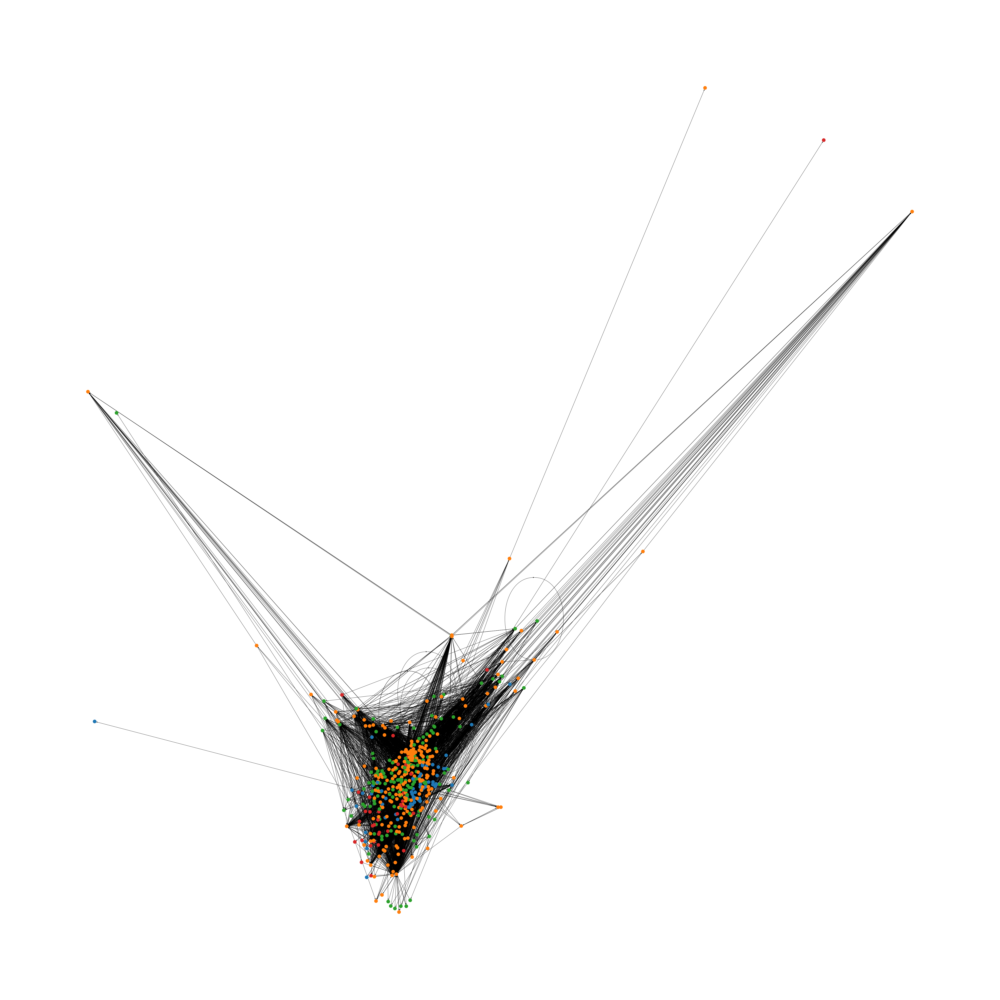

In [208]:
# Using networkx to create a graph
# Create a graph
import networkx as nx

COLORS = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

nodes_list = labelling.keys()
node_colors = []

G = nx.DiGraph()
for root in nodes_list:
    G.add_node(root)
    if(labelling[root] == 'U'):
        node_colors.append('black')
    else:
        node_colors.append(COLORS[int(labelling[root])])

# For each node in the graph, add its children
for node in adjacency_list.keys():
    for child in adjacency_list[node]:
        G.add_edge(node, child)

# Draw the graph
import matplotlib.pyplot as plt
f = plt.figure()
# Set size of the figure
f.set_size_inches(70, 70)
nx.draw(G, node_color=node_colors)

plt.show()
# nx.pagerank(G)

### Label Propogation Using the Sklearn Library

In [209]:
from sklearn.preprocessing import MinMaxScaler # for feature scaling
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay # for showing confusion matrix
from sklearn.preprocessing import MinMaxScaler # for feature scaling
from sklearn.semi_supervised import LabelPropagation # for assigning labels to unlabeled data

# Creating the Label Propagation model
model_LP_knn = LabelPropagation(kernel='knn',    # {'knn', 'rbf'} default='rbf'
                              #gamma=70,         # default=20, Parameter for rbf kernel.
                              n_neighbors=5,    # default=7, Parameter for knn kernel which is a strictly positive integer.
                              max_iter=1000,     # default=30, Maximum number of iterations allowed.
                              tol=0.001,         # default=1e-3, Convergence tolerance: threshold to consider the system at steady state.
                             )

# Creating X and Y for the model
X = FINAL_FEATURE_DATAFRAME.to_numpy()
Y = []

for node in labelling.keys():
    if node in difficulty_map:
        Y.append(int(difficulty_map[node]))
    else:
        Y.append(-1)

sc = MinMaxScaler()

# Scaling the features
X = sc.fit_transform(X)
Y = np.array(Y, dtype=np.int8)

In [210]:
# Training the Model
model_LP_knn.fit(X, Y)

LabelPropagation(kernel='knn', n_neighbors=5)

In [211]:
# Predicting the labels for the unlabeled data
Y_pred = model_LP_knn.transduction_

print(Y_pred)

[1 2 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 2 2 0 1
 2 2 2 0 0 2 0 0 0 0 0 3 0 2 0 0 0 0 0 0 0 0 0 0 2 1 1 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 1 0 0 2 2 3 2 3 1 1 2 2 2 0 0 0 0 0 0 2 0 2 0 0 0 0 0 0 2 0 2 0 2
 0 0 0 0 0 0 0 2 2 0 1 0 0 0 2 0 2 2 0 3 2 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 2 3 1 2 0 0 0 0 0 0 0 0 1 2 3 0 0 0 1 3 1 0 0 0 0 0 0 0 0 2 0 3 1 0
 3 0 0 0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 2 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0
 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

Visualizing the Graph

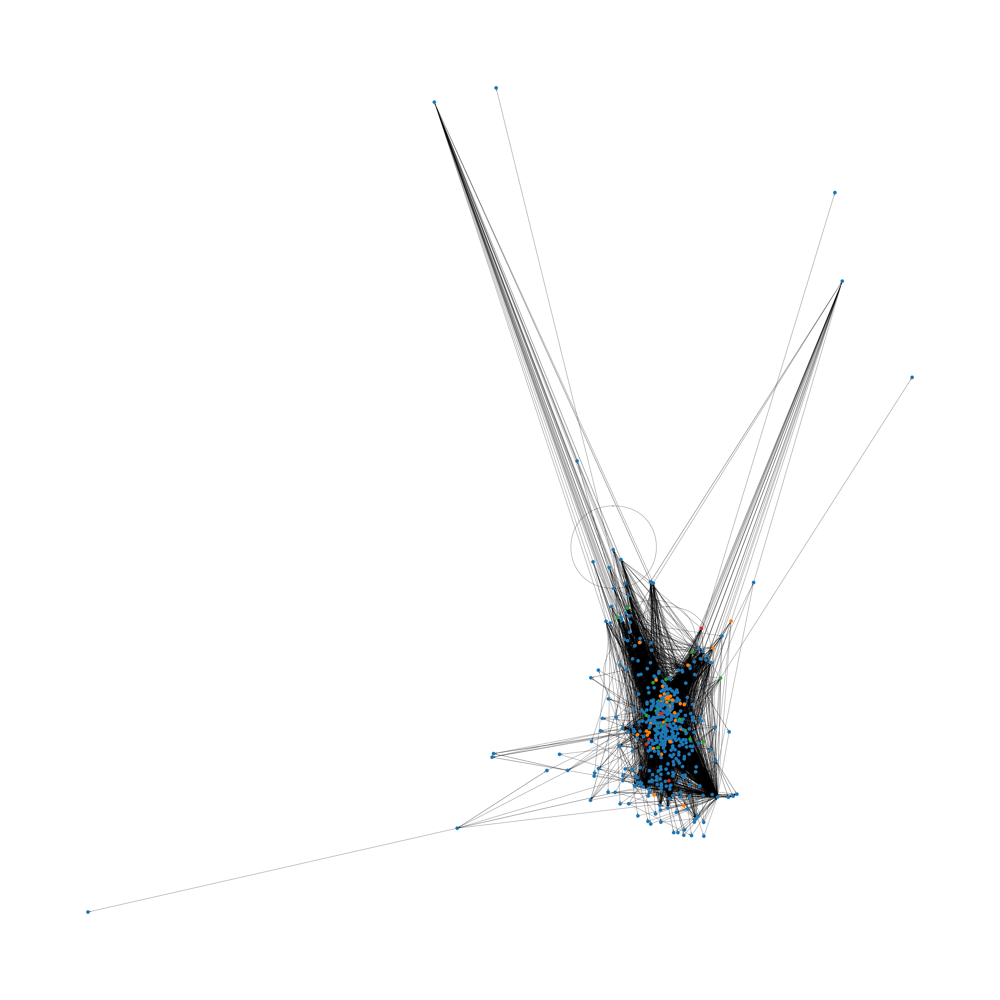

In [212]:
# Using networkx to create a graph
# Create a graph
import networkx as nx

COLORS = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728']

nodes_list = FINAL_FEATURE_DATAFRAME.index.tolist()
node_colors = []

G = nx.DiGraph()
for root in nodes_list:
    G.add_node(root)
    node_colors.append(COLORS[int(Y_pred[nodes_list.index(root)])])

# For each node in the graph, add its children
for node in adjacency_list.keys():
    for child in adjacency_list[node]:
        G.add_edge(node, child)

# Draw the graph
import matplotlib.pyplot as plt
f = plt.figure()
# Set size of the figure
f.set_size_inches(70, 70)
nx.draw(G, node_color=node_colors)

plt.show()
# nx.pagerank(G)

### Training an ANN on our Dataset

Creating X Train and Y Train

In [213]:
from sklearn.preprocessing import MinMaxScaler # for feature scaling
# Creating a Scaler for feature Scaling
scaler = MinMaxScaler()

In [214]:
df = FINAL_FEATURE_DATAFRAME.copy()

# Labels for original root nodes for which we know the ground truth.
labelling = difficulty_map.copy()

X_train = []
y_train = []

# Since, we are having a small graph and less root nodes, we will use all the root nodes for training.

# looping through the adjacency list
for node in adjacency_list.keys():
    if node in labelling.keys():
        # Appending the feature vector to X_train
        X_train.append(df.loc[node].values)
        # Appending the Output Label to Y_train
        y_train.append(int(labelling[node]))

X_train = np.array(X_train)
y_train = np.array(y_train)

# One hot encode y_train
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder()
encoder.fit(np.array([0, 1, 2, 3]).reshape(-1, 1))
y_train = encoder.transform(y_train.reshape(-1,1)).toarray()

print(X_train[0])
print(y_train[0])

print(X_train[1])
print(y_train[1])

print(y_train)

[-5.10746563e-03 -2.32695134e-05  3.69876678e-04 ...  3.39385475e-01
  1.49790061e-02  1.60822574e-03]
[0. 1. 0. 0.]
[-3.06121585e-03  2.32835208e-06  1.48705068e-04 ...  3.19736842e-01
  3.22691028e-03  3.37423502e-04]
[0. 0. 1. 0.]
[[0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]]


In [215]:
# Feature Scaling
X_train = scaler.fit_transform(X_train)

In [216]:
X_train

array([[0.82765777, 0.91513078, 0.09139154, ..., 0.61331178, 0.31353511,
        0.25247096],
       [0.90830208, 0.96192651, 0.06693023, ..., 0.47296554, 0.06754451,
        0.00575746],
       [0.75642338, 0.92584453, 0.07612055, ..., 0.64417098, 0.11813525,
        0.12737833],
       ...,
       [0.15927754, 0.        , 1.        , ..., 0.26259239, 0.        ,
        0.        ],
       [0.81609609, 0.92318902, 0.06934397, ..., 0.48809015, 0.13807645,
        0.08229675],
       [0.81609609, 0.92318902, 0.06934397, ..., 0.49129588, 0.        ,
        0.        ]])

Creating the ANN

In [217]:
# ANN model
from keras.models import Sequential
from keras.layers import Dense
# Initialize the model
model = Sequential()
# Add the first layer
model.add(Dense(units=64, activation='relu', input_dim=X_train.shape[1]))
# Add the second layer
model.add(Dense(units=64, activation='relu'))
# Add the third layer
model.add(Dense(units=64, activation='relu'))
# Add the output layer
# Output can be 'Advanced':3, 'Intermediate':2, 'Beginner':1, 'Irrelevent':0
model.add(Dense(units=4, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

Training and Evaluating the ANN

In [218]:
# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32)

Epoch 1/50
2/2 [==============================] - 1s 13ms/step - loss: 1.6066 - accuracy: 0.4000
Epoch 2/50
2/2 [==============================] - 0s 10ms/step - loss: 1.3104 - accuracy: 0.4200
Epoch 3/50
2/2 [==============================] - 0s 15ms/step - loss: 1.2505 - accuracy: 0.4800
Epoch 4/50
2/2 [==============================] - 0s 11ms/step - loss: 1.2644 - accuracy: 0.4800
Epoch 5/50
2/2 [==============================] - 0s 10ms/step - loss: 1.2389 - accuracy: 0.3400
Epoch 6/50
2/2 [==============================] - 0s 10ms/step - loss: 1.2336 - accuracy: 0.4800
Epoch 7/50
2/2 [==============================] - 0s 10ms/step - loss: 1.1814 - accuracy: 0.4000
Epoch 8/50
2/2 [==============================] - 0s 12ms/step - loss: 1.1183 - accuracy: 0.5000
Epoch 9/50
2/2 [==============================] - 0s 10ms/step - loss: 1.0978 - accuracy: 0.3800
Epoch 10/50
2/2 [==============================] - 0s 12ms/step - loss: 1.0390 - accuracy: 0.8000
Epoch 11/50
2/2 [============

In [219]:
# Labelling the remaining nodes using the model
# X_test will be the nodes, which we are labelling using our ANN. These are nodes for which we do not know the ground truth.

X_test = []
X_test_nodes = []

for node in adjacency_list.keys():
    if node not in labelling.keys():
        X_test.append(df.loc[node].values)
        X_test_nodes.append(node)
    
X_test = np.array(X_test)

In [220]:
# Feature Scaling
X_test = scaler.transform(X_test)

In [221]:
X_test.shape

(450, 6227)

In [222]:
# Predict the labels
y_pred = model.predict(X_test)
# One hot decode the labels : Find the index of the maximum value
y_pred = np.argmax(y_pred, axis=1)

In [223]:
print(y_pred)

[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 1 1 1 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 0 1 1 0 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 1 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 1 2 1 2 2 1 2
 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 1 2 2 1 2 2 2 2 1 2 2 1 2 2 2 2 2 2 2 2 1 2 2 1 1 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 1 2 2 2 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2
 2 1 2 2 2 2 1 2 2 1 2 2 2 2 1 2 2 2 2 2 1 2 2 1 2 1 1 2 1 2 2 2 2 1 2 2 2
 1 2 2 2 2 2]


In [224]:
# Assign the labels to the nodes
for i in range(len(X_test_nodes)):
    labelling[X_test_nodes[i]] = y_pred[i]

In [225]:
print(labelling)

{'https://en.wikipedia.org/wiki/Absolute_value': 1, 'https://en.wikipedia.org/wiki/Addition_theorem': 1, 'https://en.wikipedia.org/wiki/Adjugate_matrix': 2, 'https://en.wikipedia.org/wiki/Algebra_of_sets': 2, 'https://en.wikipedia.org/wiki/Algorithm': 2, 'https://en.wikipedia.org/wiki/Altitude_(triangle)': 2, 'https://en.wikipedia.org/wiki/Angle_bisector_theorem': 1, 'https://en.wikipedia.org/wiki/Antiderivative': 2, 'https://en.wikipedia.org/wiki/Area_under_the_curve_(pharmacokinetics)': 3, 'https://en.wikipedia.org/wiki/Arithmetic_mean': 1, 'https://en.wikipedia.org/wiki/Arithmetic_progression': 1, 'https://en.wikipedia.org/wiki/Arithmetico%E2%80%93geometric_sequence': 2, 'https://en.wikipedia.org/wiki/Arithmetico–geometric_sequence': 3, 'https://en.wikipedia.org/wiki/Asymptote': 2, 'https://en.wikipedia.org/wiki/Basis_(linear_algebra)': 2, 'https://en.wikipedia.org/wiki/Bayes%27_theorem': 2, 'https://en.wikipedia.org/wiki/Bayesian_probability': 3, 'https://en.wikipedia.org/wiki/Benn

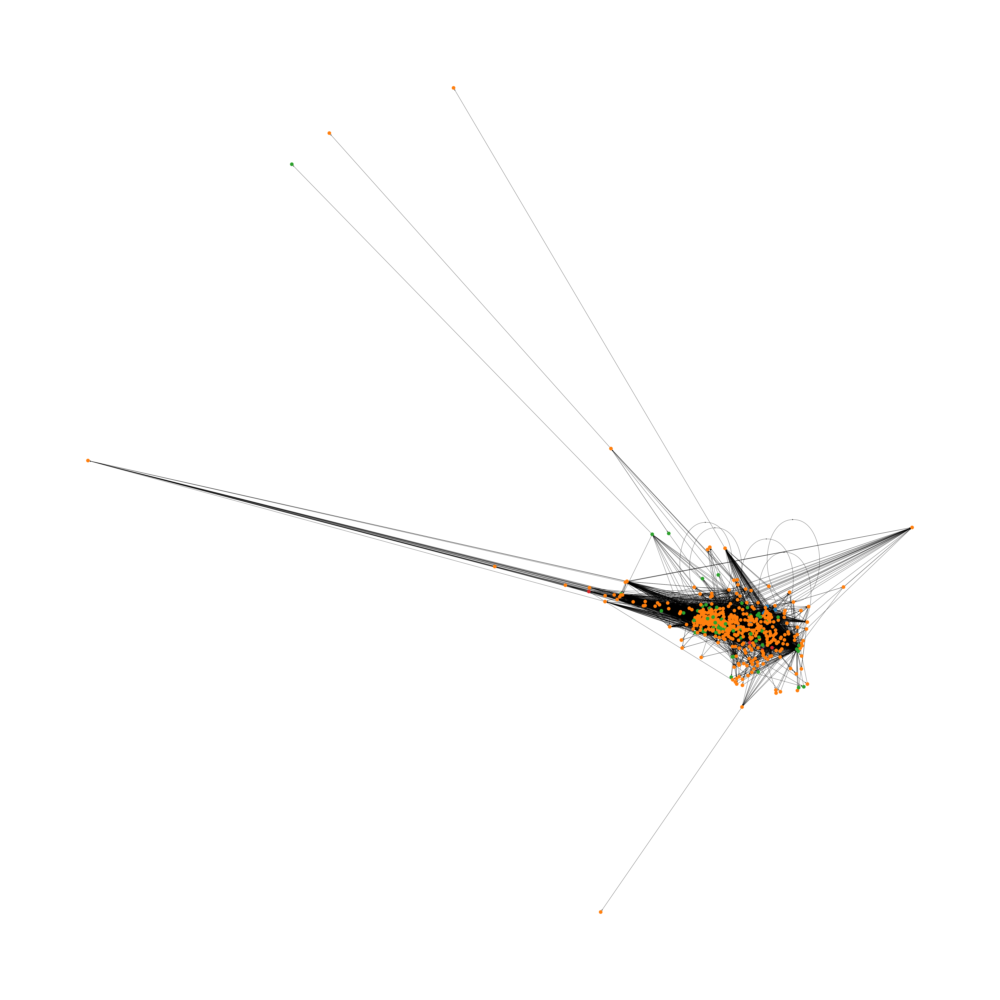

In [226]:
# Plot the graph
G = nx.DiGraph()
nodes_list = labelling.keys()
colors = []
for root in nodes_list:
    G.add_node(root)
    if(labelling[root] == 'U'):
        colors.append('black')
    else:
        colors.append(COLORS[int(labelling[root])])

for node in adjacency_list.keys():
    for child in adjacency_list[node]:
        G.add_edge(node, child)

# Draw the graph
f = plt.figure()
# Set size of the figure
f.set_size_inches(70, 70)
nx.draw(G, node_color=colors)
plt.show()

### Graph Traversal and Article Ordering Algorithm

We have implemented 2 types of Article Ordering

Note: Every article is essentially a link to some wiki page. So, we will use the terms link and article interchangeably.

1. A person comes and says, "Hey, i have read these links and here is my labelling for these, suggest me some links to read after these"

In that case, we have implemented a recommendation system as taught in class. We had the data of all the students and their labels. So, we used that to find the most similar persons to our user and then used their ratings to order articles for the user to read.

Note: This is like a movie recommendation system

2. User comes and says, "Hey, i want to read this link. In what order should I study for this?"

For this, we need to find relevant other links, and print in an order such that user can read the links in that order.

For this purpose, we need an idea of pre-requisite. i.e. for a link, we need to be able to find pre-requisites. But in our graph, edges not necessarily mean that one link is pre-requisite to the other.

So, we will simply order the relevant topics in order of difficulty.

Note that, here we will use the difficulty labelling that we did for all nodes using ANN.

To check relevancy, all topics within a fixed distance in our wiki graph will be considered relevant for a topic.

This means, if link A can be reached from link B in steps less than the fixed distance then A is relevant for B and B is also relevant for A.

### Recommendatation System

Importing Data

In [227]:
# Reading the Labelling Data of all the students
df = pd.read_csv('./Wiki Math Articles - Sheet1 (1).csv')

In [228]:
df = df[['Unnamed: 0', 'Label', 'Link']]

In [229]:
# remove empty rows from df
df = df.dropna()


In [230]:
df

,Unnamed: 0,Label,Link
0,72100040.0,1,https://en.wikipedia.org/wiki/Quadratic_equation
1,12041090.0,1,https://en.wikipedia.org/wiki/Complex_number
2,12041090.0,2,https://en.wikipedia.org/wiki/Bayes%27_theorem
3,12041090.0,1,https://en.wikipedia.org/wiki/Line_(geometry)
4,12041090.0,1,https://en.wikipedia.org/wiki/Function_(mathem...
...,...,...,...
838,12040100.0,0,https://en.wikipedia.org/wiki/Probability_theory
839,12040100.0,1,https://en.wikipedia.org/wiki/Function_(mathem...
840,12040100.0,1,https://en.wikipedia.org/wiki/Circle#:~:text=A...
841,12040100.0,2,https://en.wikipedia.org/wiki/Calculus#:~:text...


Creating the Person-Topic Rating Dataframe

In [231]:
person_rating = dict()

In [232]:
# looping through the df
for i in range(len(df)):

    # roll is the roll number of the student
    roll = int(df.iloc[i]['Unnamed: 0'])
    link = df.iloc[i]['Link'].strip()

    # cleaning the df

    # if the '#' is present in the link then consider only the part before the '#'
    if "#" in link:
        link = link.split("#")[0]
    
    # if the ':' is present in the link more than once then remove that link
    if link.count(":") > 1:
        continue       
    
    # consider only the link with "https://en.wikipedia.org"
    if link.startswith("https://en.wikipedia.org"):
    
        label = df.iloc[i]['Label']
    
        if(person_rating.get(roll) is None):
            person_rating[roll] = dict()
        
        person_rating[roll][link] = label

In [233]:
print(person_rating[11940140])

{'https://en.wikipedia.org/wiki/Quotient_rule': '2', 'https://en.wikipedia.org/wiki/Product_rule': '1', 'https://en.wikipedia.org/wiki/Line_(geometry)': '1', 'https://en.wikipedia.org/wiki/List_of_trigonometric_identities': '3', 'https://en.wikipedia.org/wiki/Tangent_half-angle_formula': '3', 'https://en.wikipedia.org/wiki/Cross_product': '1', 'https://en.wikipedia.org/wiki/Integration_by_parts': '2', 'https://en.wikipedia.org/wiki/Bayes%27_theorem': '2', 'https://en.wikipedia.org/wiki/Complex_number': '1', 'https://en.wikipedia.org/wiki/Mathematical_logic': '0', 'https://en.wikipedia.org/wiki/Inverse_trigonometric_functions': '2', 'https://en.wikipedia.org/wiki/Harmonic_mean': '1', 'https://en.wikipedia.org/wiki/Sample_space': '1', 'https://en.wikipedia.org/wiki/Section_formula': '1', 'https://en.wikipedia.org/wiki/Coordinate_system': '1', 'https://en.wikipedia.org/wiki/Parametric_equation': '2', 'https://en.wikipedia.org/wiki/Arithmetic_mean': '1', 'https://en.wikipedia.org/wiki/Quad

In [234]:
print(person_rating[11940510])

{'https://en.wikipedia.org/wiki/Limit_of_a_function': '0', 'https://en.wikipedia.org/wiki/Rolle%27s_theorem': '1', 'https://en.wikipedia.org/wiki/Polynomial': '1', 'https://en.wikipedia.org/wiki/Differentiation_of_trigonometric_functions': '2', 'https://en.wikipedia.org/wiki/Trigonometric_functions': '1', 'https://en.wikipedia.org/wiki/Logarithmic_derivative': '1', 'https://en.wikipedia.org/wiki/Logarithmic_differentiation': '2', 'https://en.wikipedia.org/wiki/Differentiation_rules': '1', 'https://en.wikipedia.org/wiki/Calculus': '0', 'https://en.wikipedia.org/wiki/Plane_(geometry)': '2', 'https://en.wikipedia.org/wiki/Tangent': '1', 'https://en.wikipedia.org/wiki/Secant_line': '1', 'https://en.wikipedia.org/wiki/Root_of_unity': '2', 'https://en.wikipedia.org/wiki/Triangle_inequality': '1', 'https://en.wikipedia.org/wiki/Logarithm': '1', 'https://en.wikipedia.org/wiki/E_(mathematical_constant)': '2', 'https://en.wikipedia.org/wiki/Leibniz_integral_rule': '3', 'https://en.wikipedia.org/

In [235]:
PERSON_RATING_DF = pd.DataFrame.from_dict(person_rating, orient='index')

In [236]:
# Replace NaN with -1
PERSON_RATING_DF = PERSON_RATING_DF.fillna(-1)

PERSON_RATING_DF

,https://en.wikipedia.org/wiki/Quadratic_equation,https://en.wikipedia.org/wiki/Complex_number,https://en.wikipedia.org/wiki/Bayes%27_theorem,https://en.wikipedia.org/wiki/Line_(geometry),https://en.wikipedia.org/wiki/Function_(mathematics),https://en.wikipedia.org/wiki/L%27H%C3%B4pital%27s_rule,https://en.wikipedia.org/wiki/Intermediate_value_theorem,https://en.wikipedia.org/wiki/Mean_value_theorem,https://en.wikipedia.org/wiki/Rolle%27s_theorem,https://en.wikipedia.org/wiki/Derivative,...,https://en.wikipedia.org/wiki/Integer_factorization,https://en.wikipedia.org/wiki/Regression_analysis,https://en.wikipedia.org/wiki/Division_algorithm,https://en.wikipedia.org/wiki/Fibonacci_number,https://en.wikipedia.org/wiki/Euclid%27s_lemma,https://en.wikipedia.org/wiki/Complex_analysis,https://en.wikipedia.org/wiki/Algorithm,https://en.wikipedia.org/wiki/Differentiation,https://en.wikipedia.org/wiki/Linear_algebra,https://en.wikipedia.org/wiki/Straight_Lines
72100040,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
12040070,2,2,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
12040130,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
11941050,1,2,3,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
12041710,1,2,-1,-1,-1,-1,-1,-1,-1,1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
11940140,1,1,2,1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
11940480,1,-1,2,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
11941340,1,3,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,2,2,-1
12041740,1,2,2,-1,-1,1,-1,3,3,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,1
12041090,-1,1,2,1,1,2,2,3,3,1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [237]:
# We will take a sample user from our dataset only. This part can be taken as user input.

sample_user_id = 11940140
sample_user = PERSON_RATING_DF.loc[sample_user_id]

In [238]:
print(sample_user)

https://en.wikipedia.org/wiki/Quadratic_equation         1
https://en.wikipedia.org/wiki/Complex_number             1
https://en.wikipedia.org/wiki/Bayes%27_theorem           2
https://en.wikipedia.org/wiki/Line_(geometry)            1
https://en.wikipedia.org/wiki/Function_(mathematics)    -1
                                                        ..
https://en.wikipedia.org/wiki/Complex_analysis          -1
https://en.wikipedia.org/wiki/Algorithm                 -1
https://en.wikipedia.org/wiki/Differentiation           -1
https://en.wikipedia.org/wiki/Linear_algebra            -1
https://en.wikipedia.org/wiki/Straight_Lines            -1
Name: 11940140, Length: 447, dtype: object


Calculating the Similarity of user with other people in Dataset

In [239]:
# import the package
from scipy import spatial

max_sim = 0
sim_dic = dict()

persons_list = PERSON_RATING_DF.index.tolist()

# looping through the persons list
for person in persons_list:

    # if person is sample_user then not consider
    if int(person) == int(sample_user_id):
        continue
    
    sim = 0
    u_vec = []
    p_vec = []
    for link in sample_user.keys():

        try:
            user_rating = int(sample_user[link])
            p_rating = int(PERSON_RATING_DF.loc[person][link])
        except:
            continue
        
        if(user_rating < 0  or p_rating < 0):
            continue
        
        u_vec.append(user_rating)
        p_vec.append(p_rating)
    
    # calculating the similarity score = 0.8*(cosine similarity) + 0.2*(length of the vectors)
    if(len(u_vec) == 0 or len(p_vec) == 0):
        continue
    
    # calculating the cosine similarity between the two vectors
    u_vec = np.array(u_vec, dtype=np.int8)
    p_vec = np.array(p_vec, dtype=np.int8)
    
    print(u_vec, p_vec)
    
    # calculating the cosinesimilarity between the two vectors
    cosine_similarity = 1 - spatial.distance.cosine(u_vec, p_vec)
    
    # calculating the similarity score = 0.8*(cosine similarity) + 0.2*(length of the vectors)
    sim = 0.8*cosine_similarity + 0.2*len(u_vec)

    sim_dic[person] = sim

    # updating the max_sim
    if(sim > max_sim):
        max_sim = sim
        

[1] [1]
[1 1 3] [2 2 2]
[1] [1]
[1 1 2 3 2] [1 2 3 0 3]
[1 1] [1 2]
[1 2 1 1] [1 2 2 1]
[1 1] [1 3]
[1 1 2 2 1 1] [1 2 2 3 1 1]
[1 2 1 2] [1 2 1 2]
[1] [3]
[1] [2]
[1 2 2 2 1] [1 2 3 1 1]
[2 2 2 3] [2 3 2 2]
[2 1] [1 1]
[1 3 1 1] [1 2 2 1]
[2 2] [3 1]
[2 1] [3 2]
[2 1] [2 1]
[1] [1]
[2] [2]
[2 2] [1 1]
[2] [3]
[2 2] [3 2]
[1] [2]
[2] [1]
[2] [2]
[1] [1]
[1] [1]
[0] [2]
[1] [1]


/usr/local/lib/python3.7/dist-packages/scipy/spatial/distance.py:720: RuntimeWarning: invalid value encountered in double_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


Calculating the Most Similar people

In [240]:
print(max_sim)
print(sim_dic)

persons_to_consider = []

# looping through the sim_dic
for person in sim_dic.keys():
    # get the person with maximum similarity
    if(sim_dic[person] == max_sim):
        persons_to_consider.append(person)

1.9745966692414836
{72100040: 1.0, 12040070: 1.2963106238227915, 12040130: 1.0, 11941050: 1.574037847881928, 12041710: 1.158946638440411, 11940480: 1.564946309974012, 11941340: 1.1155417527999327, 12041740: 1.9745966692414836, 12041090: 1.6, 12041400: 1.0, 11940830: 1.0, 12040100: 1.7483314773547884, 11940690: 1.561904761904762, 11941230: 1.158946638440411, 11940120: 1.5302967433402217, 11940850: 1.1155417527999327, 12040120: 1.1938223013709344, 12040450: 1.2000000000000002, 12040180: 1.0, 11940130: 1.0, 11940910: 1.2000000000000002, 12040600: 1.0, 12041590: 1.184464540552736, 11940470: 1.0, 12040540: 1.0, 12040090: 1.0, 12040500: 1.0, 12041440: 1.0, 12041280: nan, 11841260: 1.0}


In [241]:
print(persons_to_consider)

[12041740]


In [242]:
# Articles that are not yet read by the user
link_not_by_user = []

# get the links that are not rated by the user
for link in sample_user.keys():
    if(int(sample_user[link]) < 0):
        link_not_by_user.append(link)

In [243]:
link_not_by_user

['https://en.wikipedia.org/wiki/Function_(mathematics)',
 'https://en.wikipedia.org/wiki/L%27H%C3%B4pital%27s_rule',
 'https://en.wikipedia.org/wiki/Intermediate_value_theorem',
 'https://en.wikipedia.org/wiki/Mean_value_theorem',
 'https://en.wikipedia.org/wiki/Rolle%27s_theorem',
 'https://en.wikipedia.org/wiki/Derivative',
 'https://en.wikipedia.org/wiki/Integral',
 'https://en.wikipedia.org/wiki/Triple_product',
 'https://en.wikipedia.org/wiki/Number_theory',
 'https://en.wikipedia.org/wiki/Diophantine_geometry',
 'https://en.wikipedia.org/wiki/Rational_number',
 'https://en.wikipedia.org/wiki/Prime_number',
 'https://en.wikipedia.org/wiki/Composite_number',
 'https://en.wikipedia.org/wiki/Natural_number',
 'https://en.wikipedia.org/wiki/Sampling_(statistics)',
 'https://en.wikipedia.org/wiki/Minimax',
 'https://en.wikipedia.org/wiki/Chinese_remainder_theorem',
 'https://en.wikipedia.org/wiki/Statistics',
 'https://en.wikipedia.org/wiki/Central_tendency',
 'https://en.wikipedia.org

Calculating the Recommendations for the User

In [244]:
recommendations = {}

for link in link_not_by_user:
    # find the most frequent rating given to this link by the persons in the persons_to_consider list
    freq_rating = dict()
    flag = False

    # looping through the persons_to_consider list
    for person in persons_to_consider:
        rating = int(PERSON_RATING_DF.loc[person][link])

        # if the rating is not rated by the user then not consider
        if(rating < 0):
            continue
        flag = True

        # if the rating is not present in the freq_rating then add it
        if(freq_rating.get(rating) is None):
            freq_rating[rating] = 1
        else:
            # else increment the count of the rating
            freq_rating[rating] += 1

    if not flag:
        continue

    # Find the most frequent rating
    max_freq = 0
    for rating in freq_rating.keys():
        if(freq_rating[rating] > max_freq):
            max_freq = freq_rating[rating]
    
    # Find all ratings that have the maximum frequency
    ratings_with_max_freq = []
    for rating in freq_rating.keys():
        if(freq_rating[rating] == max_freq):
            ratings_with_max_freq.append(rating)
    
    # Find the average of the ratings with the maximum frequency
    avg_rating = 0
    for rating in ratings_with_max_freq:
        avg_rating += rating
    
    avg_rating = avg_rating/len(ratings_with_max_freq)

    recommendations[link] = avg_rating


In [245]:
print(recommendations)

{'https://en.wikipedia.org/wiki/L%27H%C3%B4pital%27s_rule': 1.0, 'https://en.wikipedia.org/wiki/Mean_value_theorem': 3.0, 'https://en.wikipedia.org/wiki/Rolle%27s_theorem': 3.0, 'https://en.wikipedia.org/wiki/Parabola': 2.0, 'https://en.wikipedia.org/wiki/Trigonometric_functions': 1.0, 'https://en.wikipedia.org/wiki/Conditional_probability': 2.0, 'https://en.wikipedia.org/wiki/Logarithm': 1.0, 'https://en.wikipedia.org/wiki/Circle': 2.0, 'https://en.wikipedia.org/wiki/Hyperbola': 2.0, 'https://en.wikipedia.org/wiki/Geometric_mean': 1.0, 'https://en.wikipedia.org/wiki/Dot_product': 1.0, 'https://en.wikipedia.org/wiki/De_Morgan%27s_laws': 1.0, 'https://en.wikipedia.org/wiki/Straight_Lines': 1.0}


In [246]:
# Print the recommendations in ascending order of the ratings if rating is not 0
recommendations_list = []
for link in recommendations.keys():
    if(recommendations[link] > 0):
        recommendations_list.append((link, recommendations[link]))

# Sort the recommendations in ascending order of the difficulty rating
recommendations_list = sorted(recommendations_list, key=lambda x: x[1])

In [247]:
print("Following are the recommendations for the user with id: ", sample_user_id)
diff = ["IRRELEVENT", "BEGINNER", "INTERMEDIATE", "ADVANCED"]
for link, rating in recommendations_list:
    # Print the link and the rating
    print(link, diff[int(rating)])

Following are the recommendations for the user with id:  11940140
https://en.wikipedia.org/wiki/L%27H%C3%B4pital%27s_rule BEGINNER
https://en.wikipedia.org/wiki/Trigonometric_functions BEGINNER
https://en.wikipedia.org/wiki/Logarithm BEGINNER
https://en.wikipedia.org/wiki/Geometric_mean BEGINNER
https://en.wikipedia.org/wiki/Dot_product BEGINNER
https://en.wikipedia.org/wiki/De_Morgan%27s_laws BEGINNER
https://en.wikipedia.org/wiki/Straight_Lines BEGINNER
https://en.wikipedia.org/wiki/Parabola INTERMEDIATE
https://en.wikipedia.org/wiki/Conditional_probability INTERMEDIATE
https://en.wikipedia.org/wiki/Circle INTERMEDIATE
https://en.wikipedia.org/wiki/Hyperbola INTERMEDIATE
https://en.wikipedia.org/wiki/Mean_value_theorem ADVANCED
https://en.wikipedia.org/wiki/Rolle%27s_theorem ADVANCED


## Ordering Related Articles to study

In [248]:
sample_link = r"https://en.wikipedia.org/wiki/L%27H%C3%B4pital%27s_rule"
all_pairs_shortest_paths = all_pairs_shortest_path(adjacency_list)

RELEVENCY_DISTANCE = 1

#  get all the nodes with distance <= 2 from the sample_link in all_pairs_shortest_paths
neighbour_nodes = []
for node in all_pairs_shortest_paths[sample_link]:
    if(all_pairs_shortest_paths[sample_link][node] <= RELEVENCY_DISTANCE or all_pairs_shortest_paths[node][sample_link] <= RELEVENCY_DISTANCE):
        neighbour_nodes.append(node)

# get labelling for all the nodes in neighbour_nodes from the labelling dictionary
labels = []
for node in neighbour_nodes:
    if(int(labelling[node]) != 0):
      labels.append((node, int(labelling[node])))


# sort the labels in ascending order of the ratings
labels = sorted(labels, key=lambda x: x[1])


In [249]:
print("Following are the recommended links to read related to", sample_link)
diff = ["IRRELEVENT", "BEGINNER", "INTERMEDIATE", "ADVANCED"]
for link, rating in labels:
    # Print the link and the rating
    print(link, diff[int(rating)])

Following are the recommended links to read related to https://en.wikipedia.org/wiki/L%27H%C3%B4pital%27s_rule
https://en.wikipedia.org/wiki/Calculus BEGINNER
https://en.wikipedia.org/wiki/Chain_rule BEGINNER
https://en.wikipedia.org/wiki/ISBN_(identifier) BEGINNER
https://en.wikipedia.org/wiki/Integration_by_substitution INTERMEDIATE
https://en.wikipedia.org/wiki/Continuous_function INTERMEDIATE
https://en.wikipedia.org/wiki/Derivative INTERMEDIATE
https://en.wikipedia.org/wiki/Definite_integral INTERMEDIATE
https://en.wikipedia.org/wiki/Tangent INTERMEDIATE
https://en.wikipedia.org/wiki/Logarithm INTERMEDIATE
https://en.wikipedia.org/wiki/Line_integral INTERMEDIATE
https://en.wikipedia.org/wiki/Stochastic_calculus INTERMEDIATE
https://en.wikipedia.org/wiki/Mathematics INTERMEDIATE
https://en.wikipedia.org/wiki/Antiderivative INTERMEDIATE
https://en.wikipedia.org/wiki/Arithmetico%E2%80%93geometric_sequence INTERMEDIATE
https://en.wikipedia.org/wiki/Binomial_series INTERMEDIATE
https:/

Calculating the Diameter of the Wiki Graph

In [256]:
d = 0
node1 = 0
node2 = 0

d_u_v = 0

for u in adjacency_list.keys():
  for v in adjacency_list.keys():
    if u != v:
      d_u_v = all_pairs_shortest_paths[u][v]

      # U and V are disconnected
      if d_u_v == np.inf:
        continue

      if d_u_v > d:
        d = d_u_v
        node1 = u
        node2 = v

print("Diameter of the Graph is:", d, "between the nodes", node1, "and", node2)

Diameter of the Graph is: 10 between the nodes https://en.wikipedia.org/wiki/Absorption_(logic) and https://en.wikipedia.org/wiki/Alpha-Methyltryptamine


Performing a BFS Traversal of the Graph

In [260]:
visited = [] # List for visited nodes.
queue = [] # Initialize a queue

def my_bfs(visited, graph, node): #function for BFS
  visited.append(node)
  queue.append(node)

  while queue:          # Creating loop to visit each node
    m = queue.pop(0) 
    print (m) 

    for neighbour in graph[m]:
      if neighbour not in visited:
        visited.append(neighbour)
        queue.append(neighbour)

root_node = list(adjacency_list.keys())[0]
print("Following is the Breadth-First Search")
my_bfs(visited, adjacency_list, root_node)    # function calling

Following is the Breadth-First Search
https://en.wikipedia.org/wiki/Absolute_value
https://en.wikipedia.org/wiki/Antiderivative
https://en.wikipedia.org/wiki/Oxford_English_Dictionary
https://en.wikipedia.org/wiki/Inverse_function
https://en.wikipedia.org/wiki/Real_number
https://en.wikipedia.org/wiki/Lazare_Nicolas_Marguerite_Carnot
https://en.wikipedia.org/wiki/Square_root
https://en.wikipedia.org/wiki/Vector_space
https://en.wikipedia.org/wiki/Continuous_function
https://en.wikipedia.org/wiki/Graph_of_a_function
https://en.wikipedia.org/wiki/ISBN_(identifier)
https://en.wikipedia.org/wiki/Encyclopedia_of_Mathematics
https://en.wikipedia.org/wiki/Multiplicative_inverse
https://en.wikipedia.org/wiki/Complex_number
https://en.wikipedia.org/wiki/Additive_identity
https://en.wikipedia.org/wiki/Eric_W._Weisstein
https://en.wikipedia.org/wiki/Mathematics
https://en.wikipedia.org/wiki/Arithmetico%E2%80%93geometric_sequence
https://en.wikipedia.org/wiki/Binomial_series
https://en.wikipedia.o